# Build a Conditional GAN

### Goals
In this notebook, you're going to make a conditional GAN in order to generate hand-written images of digits, conditioned on the digit to be generated (the class vector). This will let you choose what digit you want to generate.

You'll then do some exploration of the generated images to visualize what the noise and class vectors mean.  

### Learning Objectives
1.   Learn the technical difference between a conditional and unconditional GAN.
2.   Understand the distinction between the class and noise vector in a conditional GAN.



## Getting Started

For this assignment, you will be using the MNIST dataset again, but there's nothing stopping you from applying this generator code to produce images of animals conditioned on the species or pictures of faces conditioned on facial characteristics.

Note that this assignment requires no changes to the architectures of the generator or discriminator, only changes to the data passed to both. The generator will no longer take `z_dim` as an argument, but  `input_dim` instead, since you need to pass in both the noise and class vectors. In addition to good variable naming, this also means that you can use the generator and discriminator code you have previously written with different parameters.

You will begin by importing the necessary libraries and building the generator and discriminator.

#### Packages and Visualization

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

## Class Input

In conditional GANs, the input vector for the generator will also need to include the class information. The class is represented using a one-hot encoded vector where its length is the number of classes and each index represents a class. The vector is all 0's and a 1 on the chosen class. Given the labels of multiple images (e.g. from a batch) and number of classes, please create one-hot vectors for each label. There is a class within the PyTorch functional library that can help you.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">get_one_hot_labels</font></code></b>
</font>
</summary>

1.   This code can be done in one line.
2.   The documentation for [F.one_hot](https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.one_hot) may be helpful.

</details>


In [4]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_one_hot_labels

import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    #### START CODE HERE ####
    return F.one_hot(labels, n_classes)
    #### END CODE HERE ####

In [5]:
assert (
    get_one_hot_labels(
        labels=torch.Tensor([[0, 2, 1]]).long(),
        n_classes=3
    ).tolist() == 
    [[
      [1, 0, 0], 
      [0, 0, 1], 
      [0, 1, 0]
    ]]
)
# Check that the device of get_one_hot_labels matches the input device
if torch.cuda.is_available():
    assert str(get_one_hot_labels(torch.Tensor([[0]]).long().cuda(), 1).device).startswith("cuda")
    
print("Success!")

Success!


Next, you need to be able to concatenate the one-hot class vector to the noise vector before giving it to the generator. You will also need to do this when adding the class channels to the discriminator.

To do this, you will need to write a function that combines two vectors. Remember that you need to ensure that the vectors are the same type: floats. Again, you can look to the PyTorch library for help.
<details>
<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">combine_vectors</font></code></b>
</font>
</summary>

1.   This code can also be written in one line.
2.   The documentation for [torch.cat](https://pytorch.org/docs/master/generated/torch.cat.html) may be helpful.
3.   Specifically, you might want to look at what the `dim` argument of `torch.cat` does.

</details>


In [6]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: combine_vectors
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        In this assignment, this will be the noise vector of shape (n_samples, z_dim), 
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    # Note: Make sure this function outputs a float no matter what inputs it receives
    #### START CODE HERE ####
    combined = torch.cat((x.float(), y.float()), dim = 1)  # converting tensor into float and concatanating columnwise
    #### END CODE HERE ####
    return combined

In [7]:
combined = combine_vectors(torch.tensor([[1, 2], [3, 4]]), torch.tensor([[5, 6], [7, 8]]))
if torch.cuda.is_available():
    # Check that it doesn't break with cuda
    cuda_check = combine_vectors(torch.tensor([[1, 2], [3, 4]]).cuda(), torch.tensor([[5, 6], [7, 8]]).cuda())
    assert str(cuda_check.device).startswith("cuda")
# Check exact order of elements
assert torch.all(combined == torch.tensor([[1, 2, 5, 6], [3, 4, 7, 8]]))
# Tests that items are of float type
assert (type(combined[0][0].item()) == float)
# Check shapes
combined = combine_vectors(torch.randn(1, 4, 5), torch.randn(1, 8, 5));
assert tuple(combined.shape) == (1, 12, 5)
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12).long()).shape) == (1, 30, 12)
# Check that the float transformation doesn't happen after the inputs are concatenated
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12)).shape) == (1, 30, 12)
print("Success!")

Success!


## Training
Now you can start to put it all together!
First, you will define some new parameters:

*   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
*   n_classes: the number of classes in MNIST (10, since there are the digits from 0 to 9)

In [8]:
mnist_shape = (1, 28, 28)
n_classes = 10

And you also include the same parameters from previous assignments:

  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [9]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, discriminator, and optimizers. To do this, you will need to update the input dimensions for both models. For the generator, you will need to calculate the size of the input vector; recall that for conditional GANs, the generator's input is the noise vector concatenated with the class vector. For the discriminator, you need to add a channel for every class.

In [10]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_input_dimensions
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    #### START CODE HERE ####
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0]+n_classes
    #### END CODE HERE ####
    return generator_input_dim, discriminator_im_chan

In [11]:
def test_input_dims():
    gen_dim, disc_dim = get_input_dimensions(23, (12, 23, 52), 9)
    assert gen_dim == 32
    assert disc_dim == 21
test_input_dims()
print("Success!")

Success!


In [12]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Now to train, you would like both your generator and your discriminator to know what class of image should be generated. There are a few locations where you will need to implement code.

For example, if you're generating a picture of the number "1", you would need to:
  
1.   Tell that to the generator, so that it knows it should be generating a "1"
2.   Tell that to the discriminator, so that it knows it should be looking at a "1". If the discriminator is told it should be looking at a 1 but sees something that's clearly an 8, it can guess that it's probably fake

There are no explicit unit tests here -- if this block of code runs and you don't change any of the other variables, then you've done it correctly!

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!



Step 500: Generator loss: 2.2329102648496626, discriminator loss: 0.2444653245806694


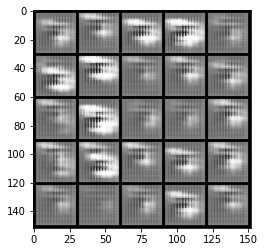

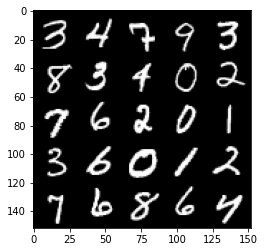

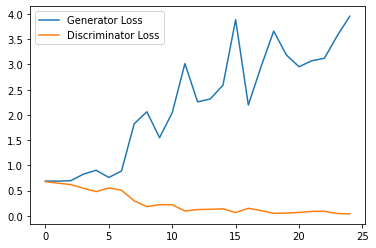

Step 1000: Generator loss: 4.292129908323288, discriminator loss: 0.06476949339732528


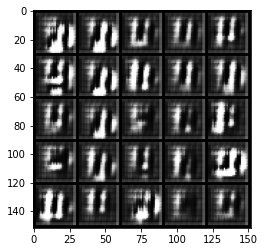

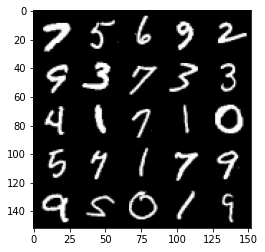

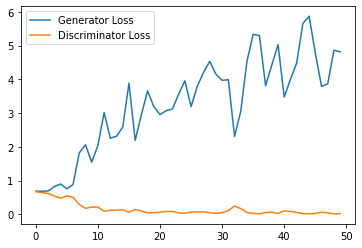

Step 1500: Generator loss: 3.461383991718292, discriminator loss: 0.11245742630958556


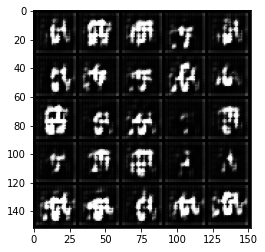

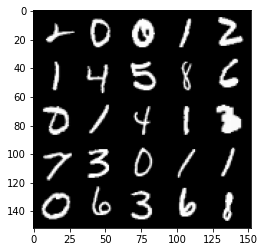

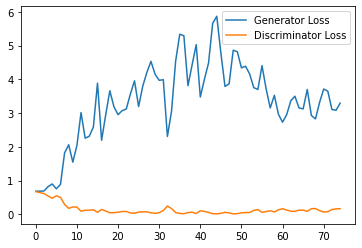

Step 2000: Generator loss: 2.81523566031456, discriminator loss: 0.2110564834922552


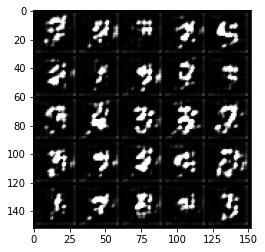

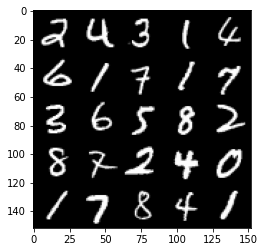

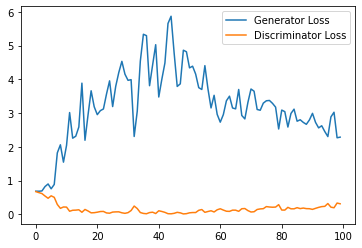

Step 2500: Generator loss: 2.3615945670604708, discriminator loss: 0.28321171858906746


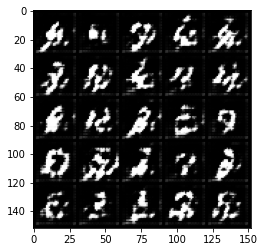

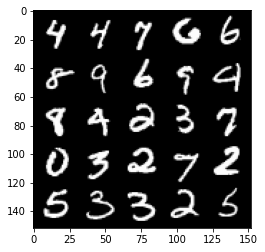

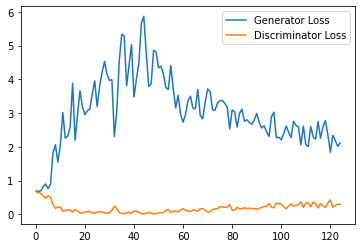

Step 3000: Generator loss: 2.1556851377487183, discriminator loss: 0.31384007850289347


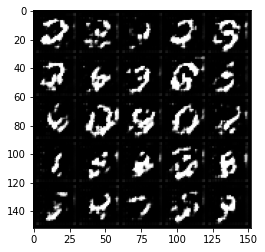

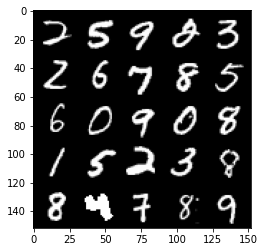

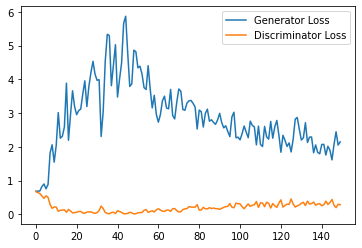

Step 3500: Generator loss: 2.048552109718323, discriminator loss: 0.3580628618299961


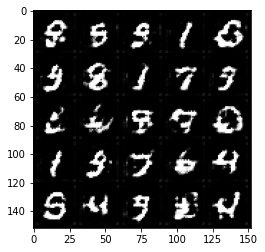

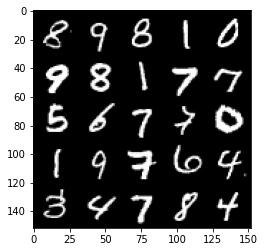

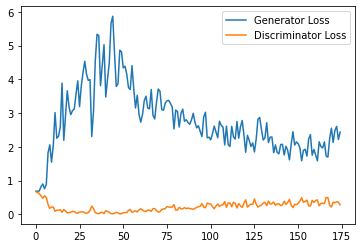

Step 4000: Generator loss: 1.9333689510822296, discriminator loss: 0.3729227908849716


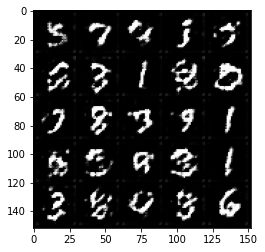

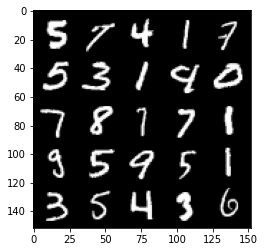

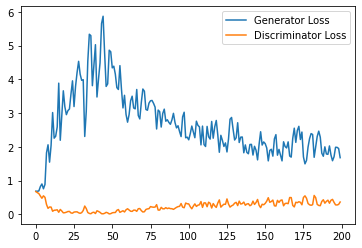

Step 4500: Generator loss: 1.8629182875156403, discriminator loss: 0.35411112025380137


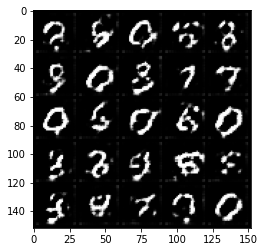

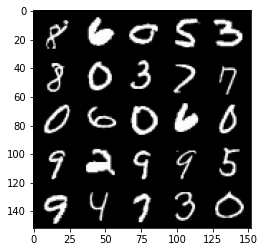

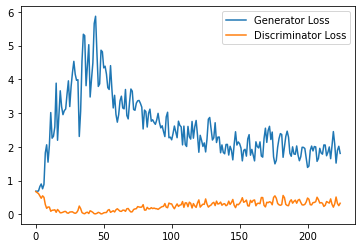

Step 5000: Generator loss: 1.8243432772159576, discriminator loss: 0.35929555603861807


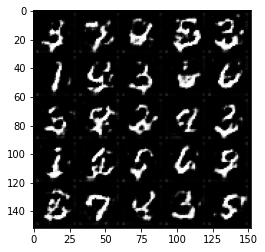

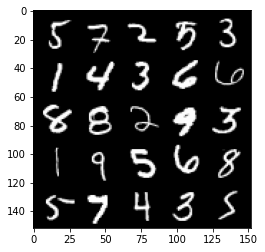

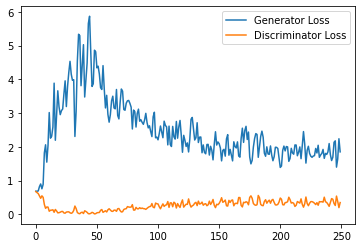

Step 5500: Generator loss: 1.8136871154308318, discriminator loss: 0.3743578085899353


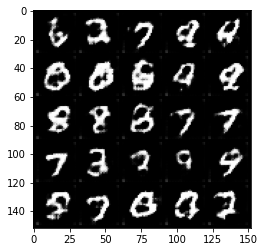

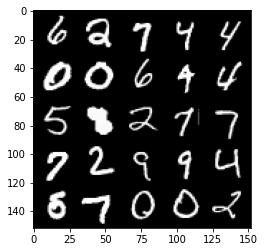

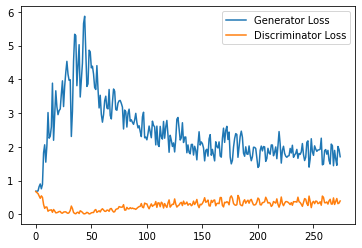

Step 6000: Generator loss: 1.6960655410289764, discriminator loss: 0.39299940708279607


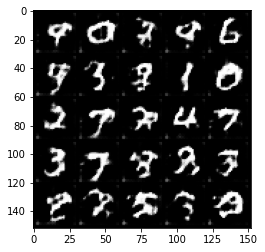

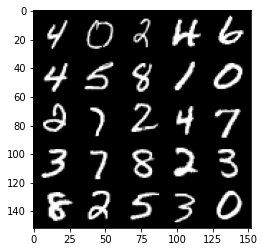

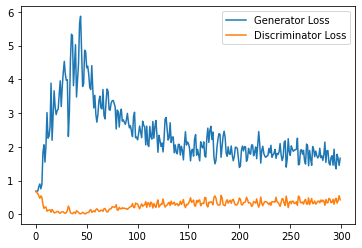

Step 6500: Generator loss: 1.5554084779024124, discriminator loss: 0.4388373609483242


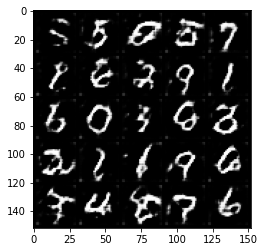

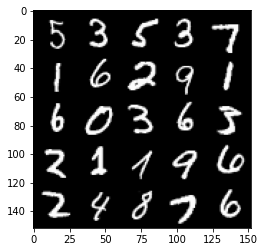

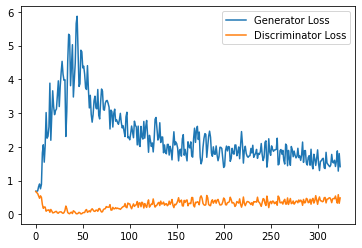

Step 7000: Generator loss: 1.4677795443534851, discriminator loss: 0.4661184848546982


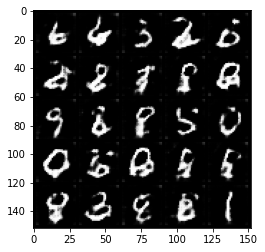

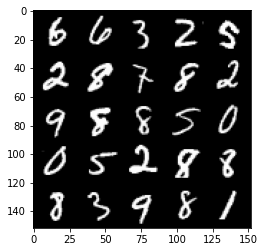

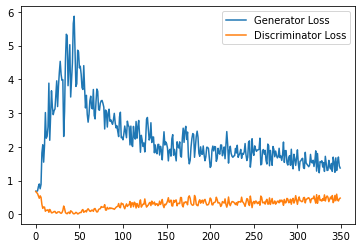

Step 7500: Generator loss: 1.4298797783851624, discriminator loss: 0.4853843093514442


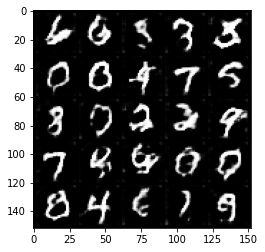

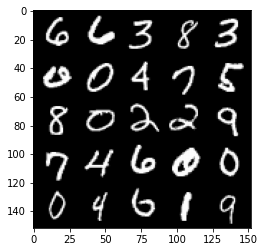

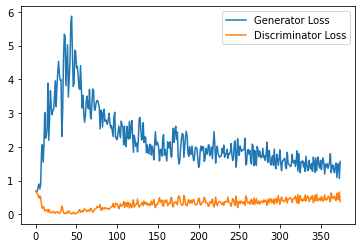

Step 8000: Generator loss: 1.3711043903827667, discriminator loss: 0.5056500763893127


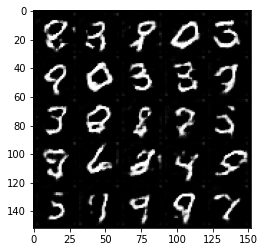

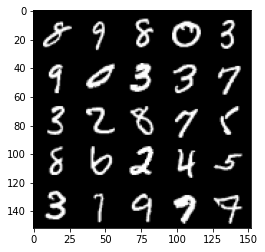

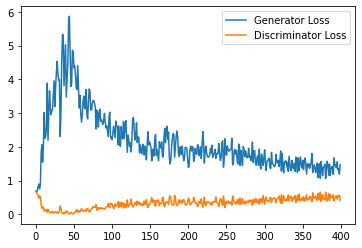

Step 8500: Generator loss: 1.2794277234077454, discriminator loss: 0.5136597954034805


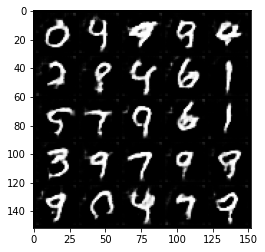

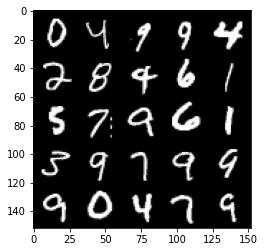

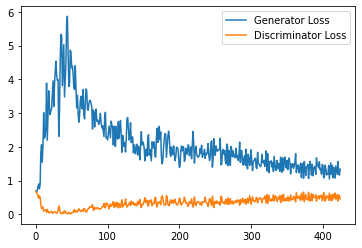

Step 9000: Generator loss: 1.270876817703247, discriminator loss: 0.529200685620308


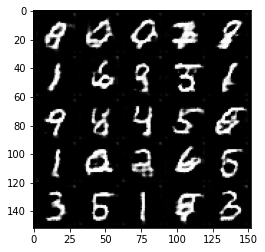

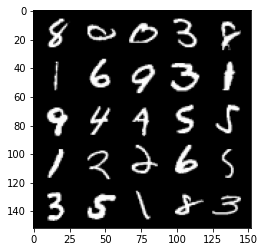

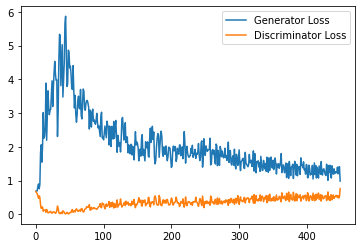

Step 9500: Generator loss: 1.2719917550086974, discriminator loss: 0.5302496910095215


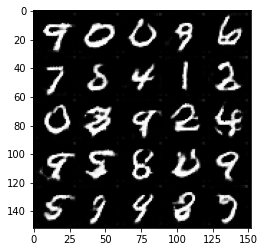

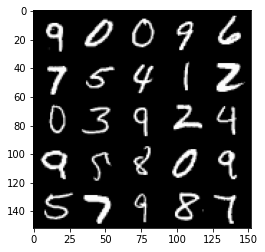

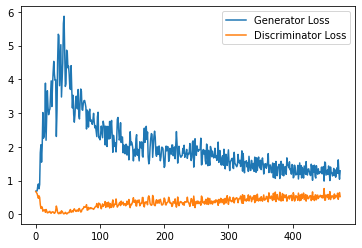

Step 10000: Generator loss: 1.228745836377144, discriminator loss: 0.5295167344808579


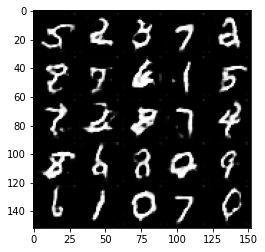

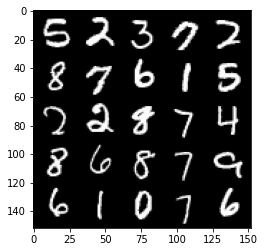

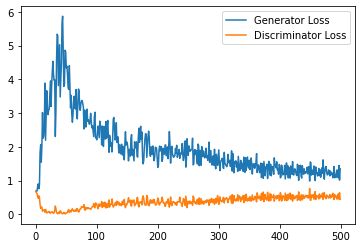

Step 10500: Generator loss: 1.1747612857818603, discriminator loss: 0.5400538626909256


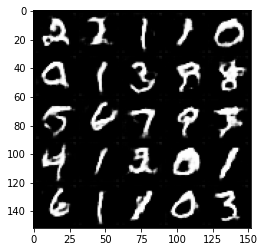

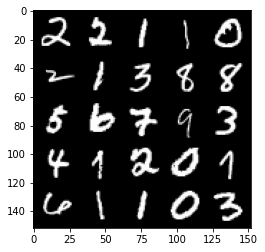

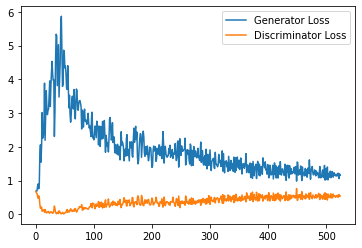

Step 11000: Generator loss: 1.2125175660848617, discriminator loss: 0.5400808362364768


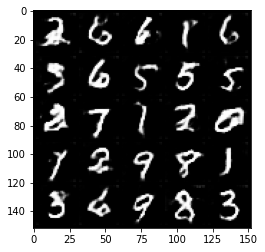

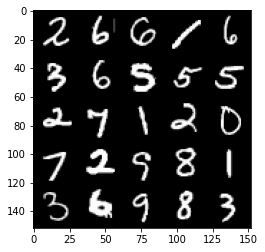

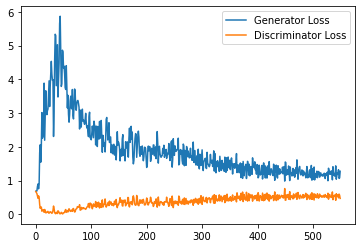

Step 11500: Generator loss: 1.172030895590782, discriminator loss: 0.5537514919042588


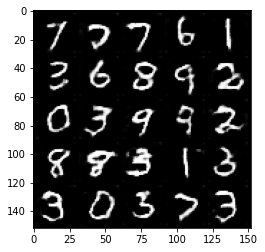

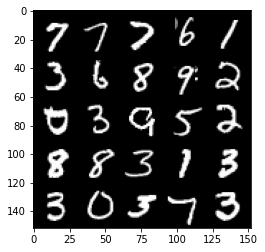

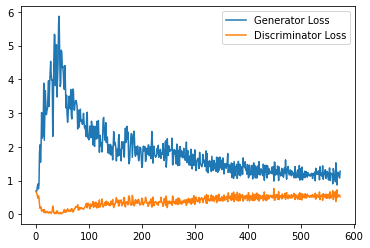

Step 12000: Generator loss: 1.1413358649015426, discriminator loss: 0.5695840308070182


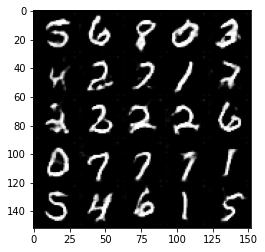

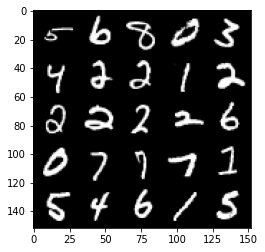

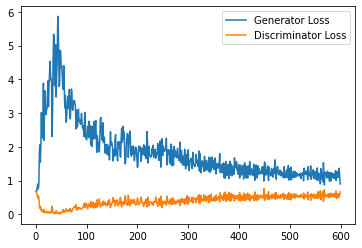

Step 12500: Generator loss: 1.1058571739196776, discriminator loss: 0.5646003323197365


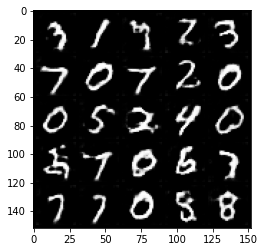

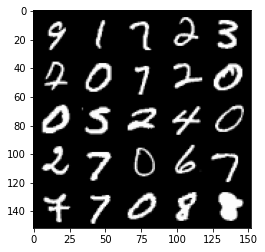

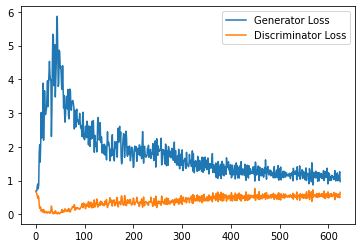

Step 13000: Generator loss: 1.1204038342237472, discriminator loss: 0.5738285174369812


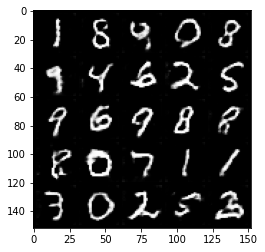

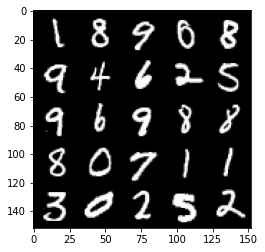

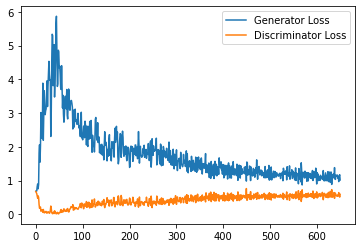

Step 13500: Generator loss: 1.0872580239772796, discriminator loss: 0.580532503247261


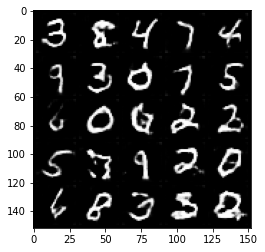

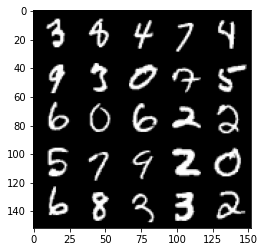

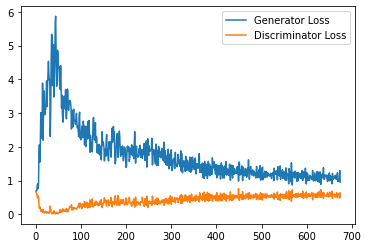

Step 14000: Generator loss: 1.0636584725379943, discriminator loss: 0.5776802149415016


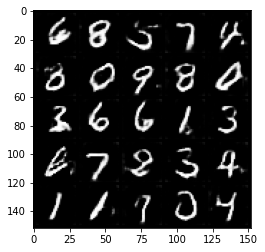

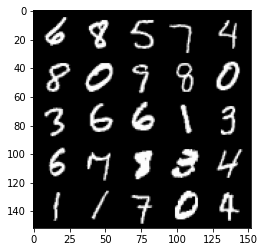

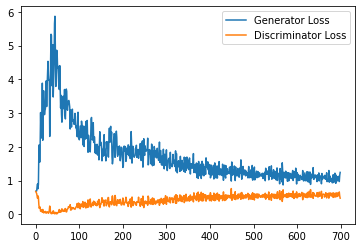

Step 14500: Generator loss: 1.113184359908104, discriminator loss: 0.5869382499456406


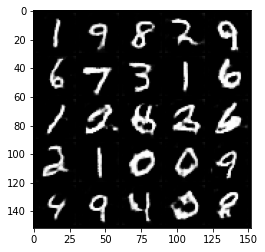

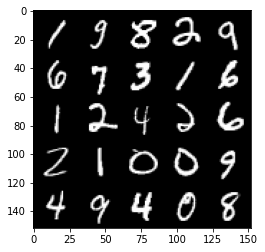

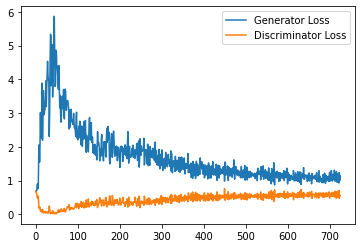

Step 15000: Generator loss: 1.0530048960447311, discriminator loss: 0.5848681311011314


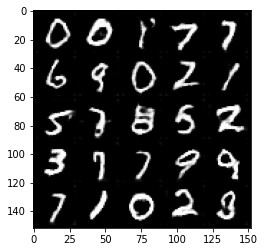

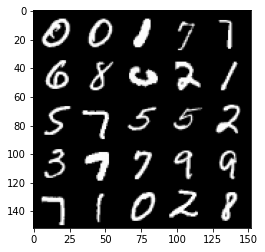

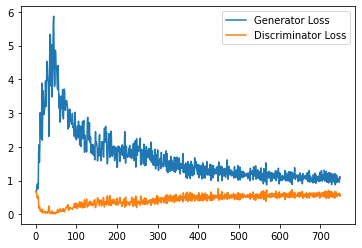

Step 15500: Generator loss: 1.0553491551876069, discriminator loss: 0.5849502652883529


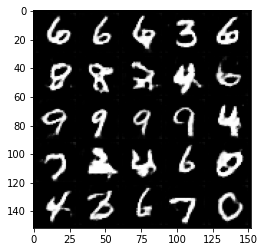

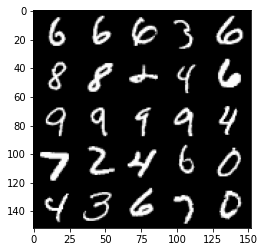

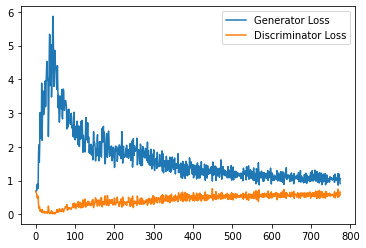

Step 16000: Generator loss: 1.0238634190559388, discriminator loss: 0.5848247995376586


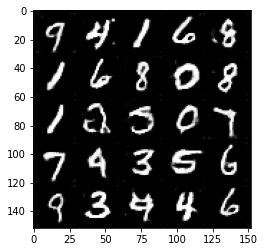

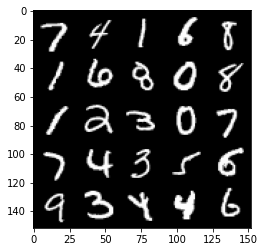

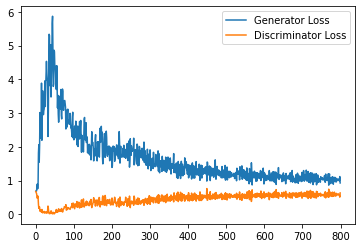

Step 16500: Generator loss: 1.0392299058437346, discriminator loss: 0.5907707178592682


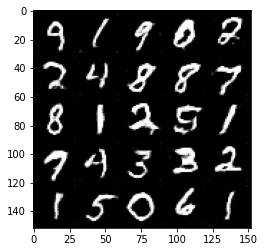

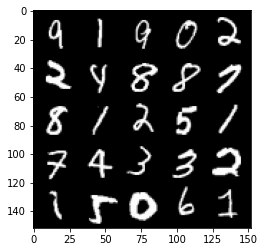

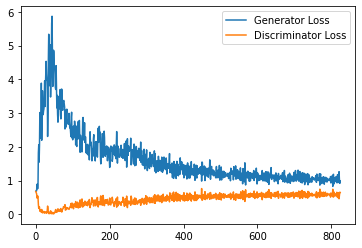

Step 17000: Generator loss: 1.1183957166671752, discriminator loss: 0.5815249159932137


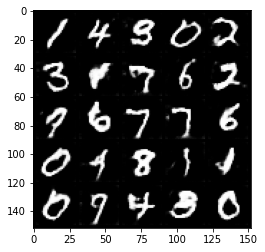

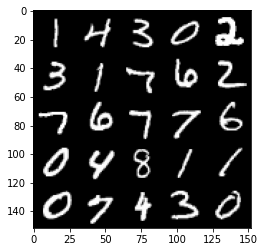

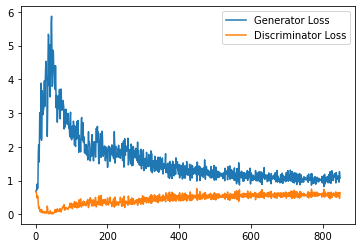

Step 17500: Generator loss: 1.0683206318616867, discriminator loss: 0.5839059774279595


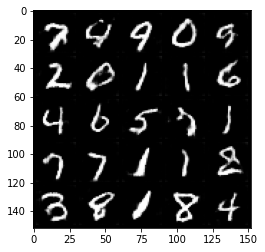

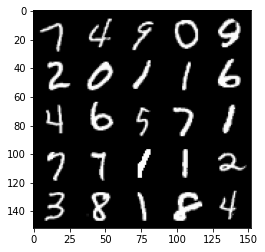

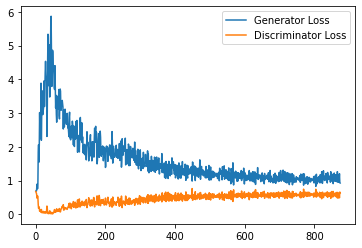

Step 18000: Generator loss: 1.018880777001381, discriminator loss: 0.584655562222004


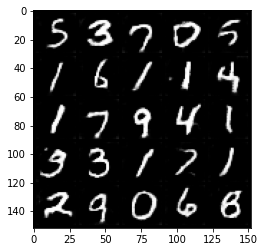

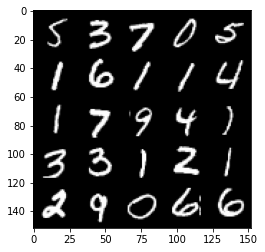

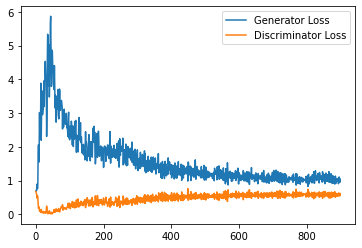

Step 18500: Generator loss: 1.049332832455635, discriminator loss: 0.5832713794112205


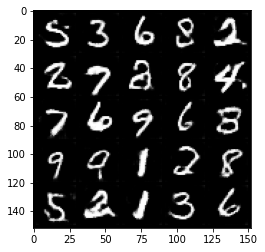

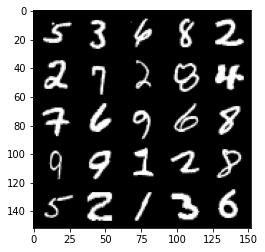

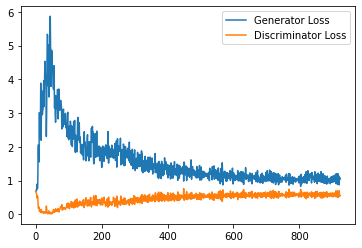

Step 19000: Generator loss: 1.0460384671688079, discriminator loss: 0.5868409352898598


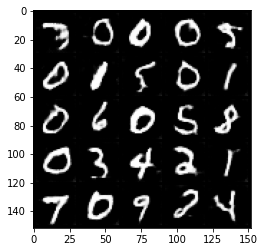

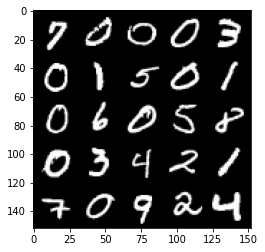

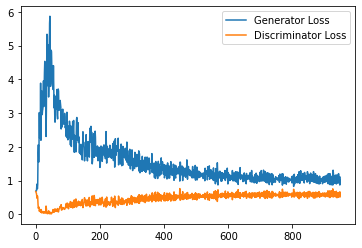

Step 19500: Generator loss: 1.0257999739646912, discriminator loss: 0.5852949153780937


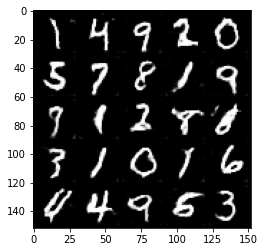

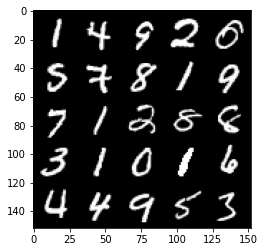

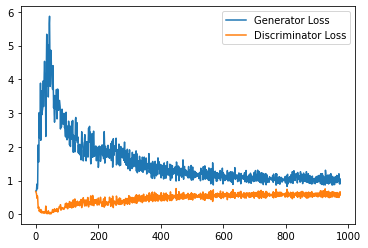

Step 20000: Generator loss: 1.027114681482315, discriminator loss: 0.5834167478680611


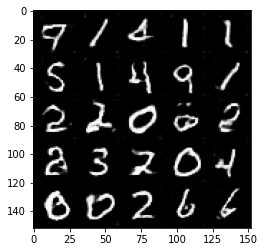

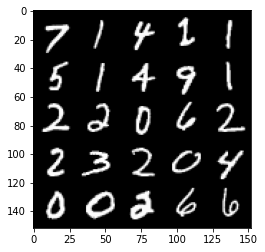

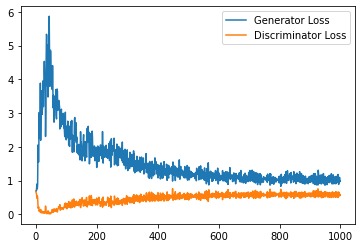

Step 20500: Generator loss: 1.0028207026720046, discriminator loss: 0.5835015923976898


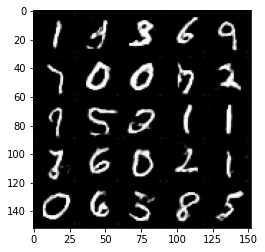

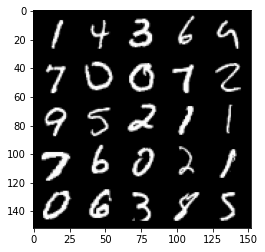

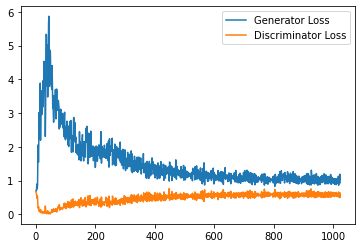

Step 21000: Generator loss: 1.0393791506290435, discriminator loss: 0.5945224430561066


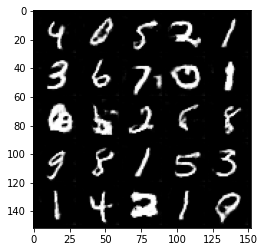

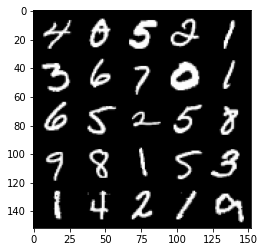

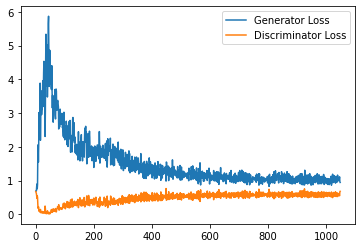

Step 21500: Generator loss: 1.0274294706583023, discriminator loss: 0.5862927508950233


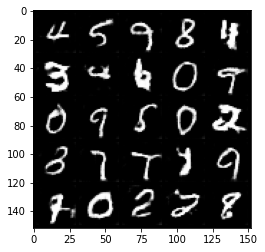

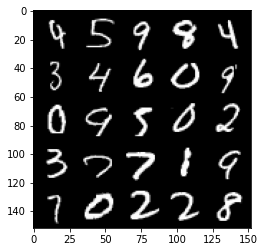

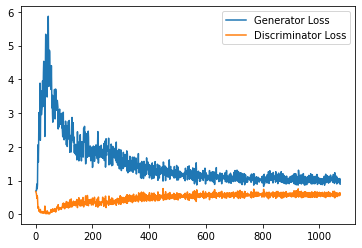

Step 22000: Generator loss: 1.0016813485622407, discriminator loss: 0.5890270511507988


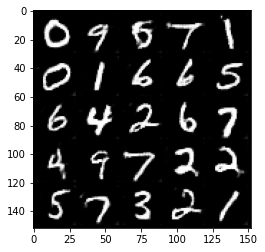

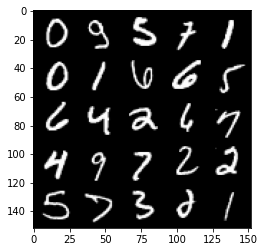

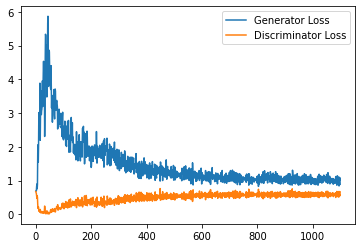

Step 22500: Generator loss: 1.0042550070285796, discriminator loss: 0.5857500433325767


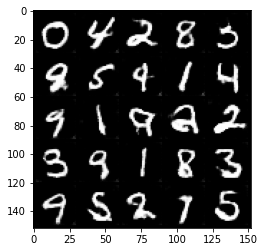

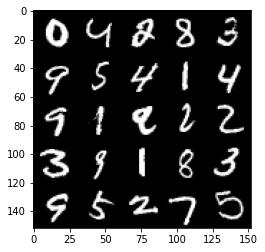

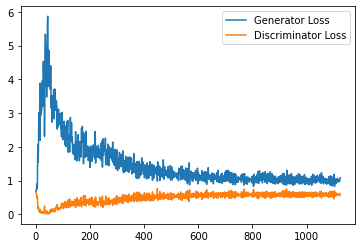

Step 23000: Generator loss: 1.0273389556407928, discriminator loss: 0.5930246527194977


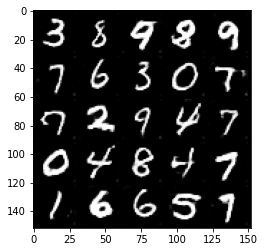

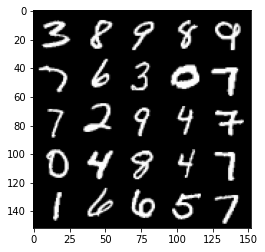

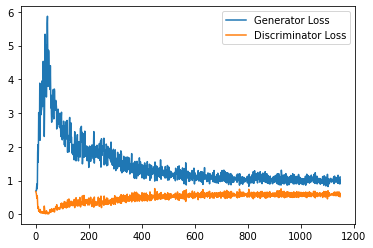

Step 23500: Generator loss: 1.0068784465789795, discriminator loss: 0.5911199820041656


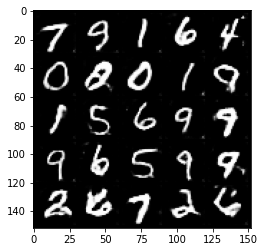

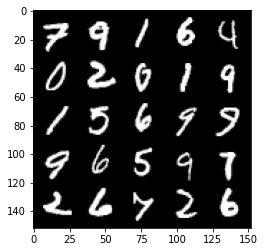

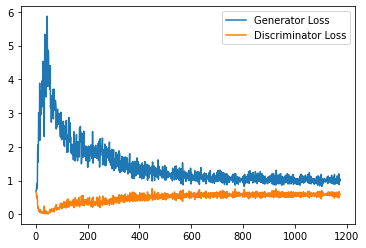

Step 24000: Generator loss: 0.9890068650245667, discriminator loss: 0.5942434607744217


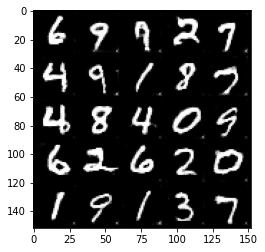

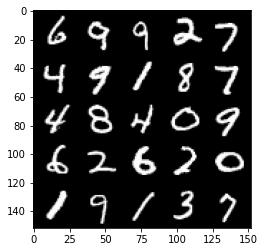

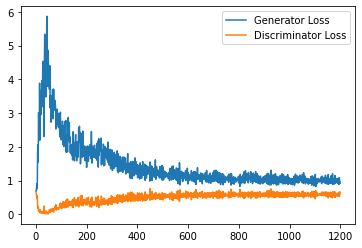

Step 24500: Generator loss: 1.0387825782299043, discriminator loss: 0.5820685995817184


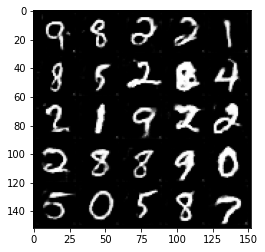

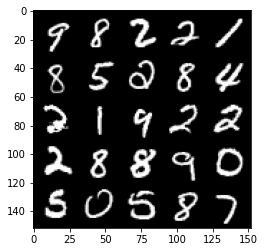

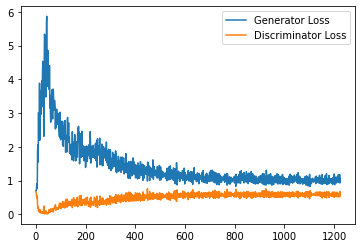

Step 25000: Generator loss: 1.0028051257133483, discriminator loss: 0.5937899762392044


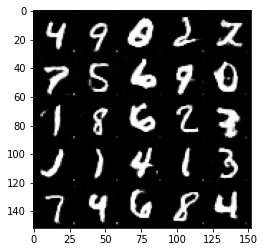

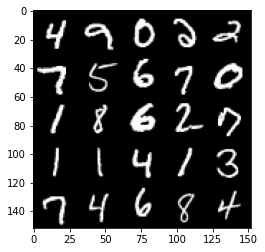

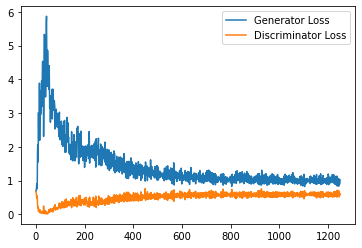

Step 25500: Generator loss: 0.9923409326076508, discriminator loss: 0.588958665728569


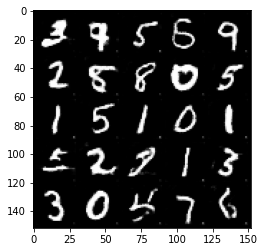

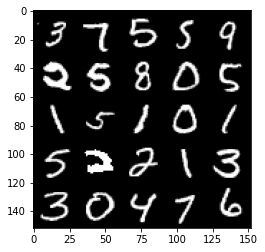

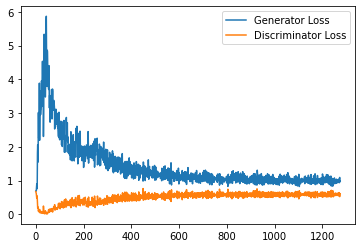

Step 26000: Generator loss: 1.0130613030195237, discriminator loss: 0.5926042633056641


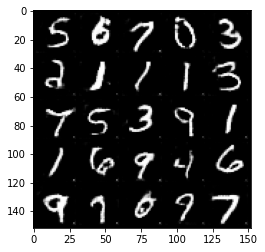

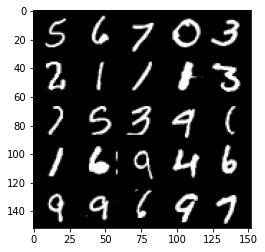

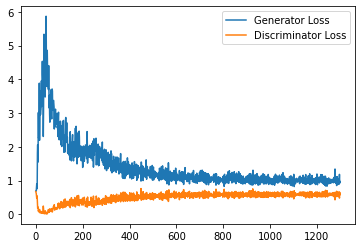

Step 26500: Generator loss: 1.0078546040058136, discriminator loss: 0.5898974466323853


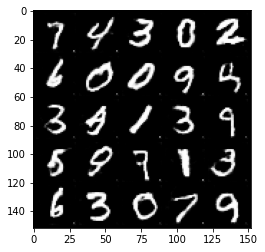

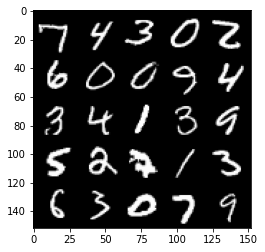

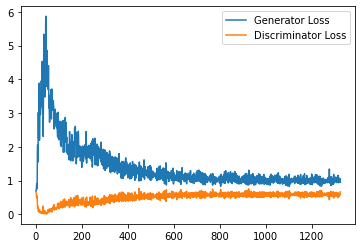

Step 27000: Generator loss: 0.9746551811695099, discriminator loss: 0.591456317961216


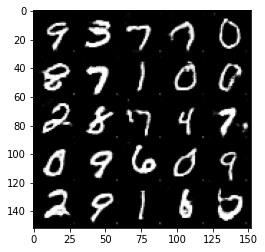

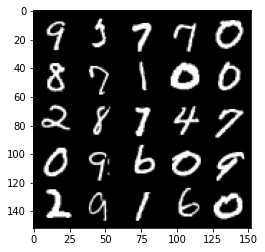

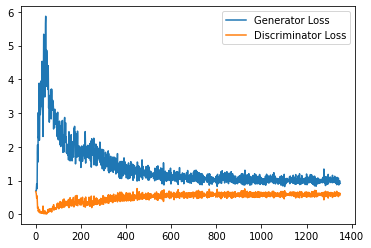

Step 27500: Generator loss: 1.0045871189832687, discriminator loss: 0.5883450130224228


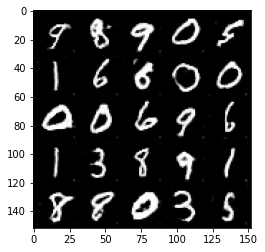

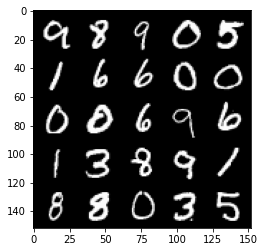

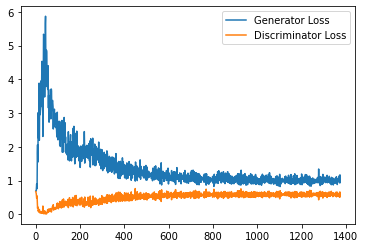

Step 28000: Generator loss: 1.0178751434087754, discriminator loss: 0.5821073614358901


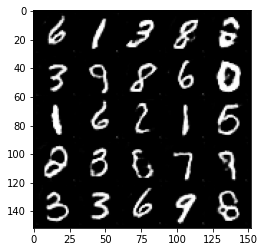

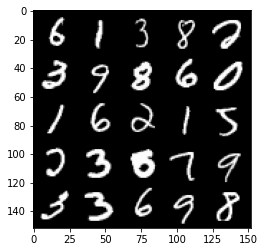

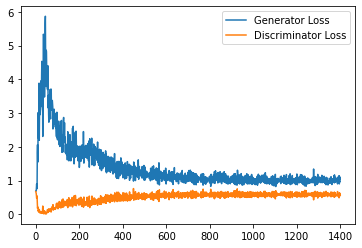

Step 28500: Generator loss: 0.9832648755311966, discriminator loss: 0.5912120164632797


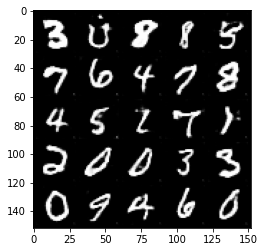

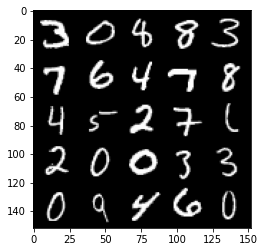

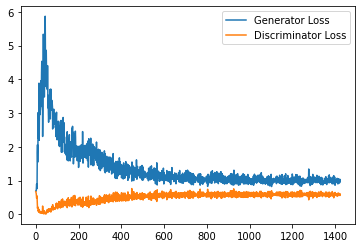

Step 29000: Generator loss: 0.9999168826341629, discriminator loss: 0.588491362273693


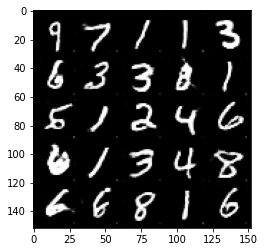

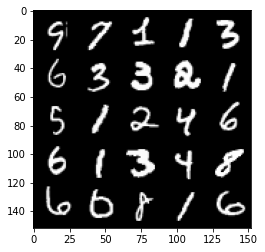

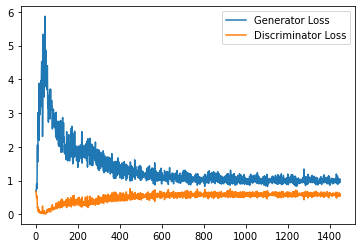

Step 29500: Generator loss: 0.996793219447136, discriminator loss: 0.5887617614269257


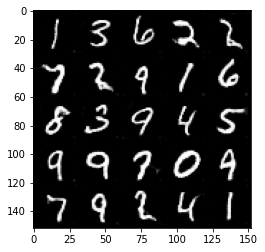

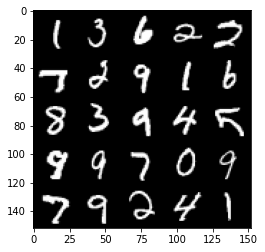

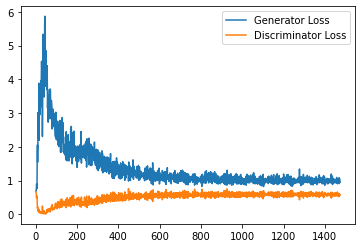

Step 30000: Generator loss: 1.0093333473205566, discriminator loss: 0.5912801588177681


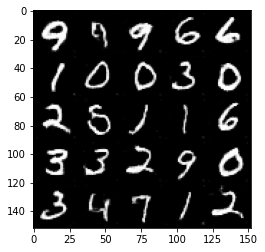

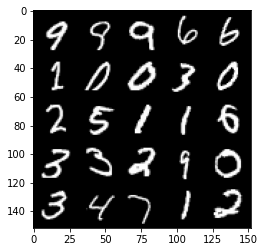

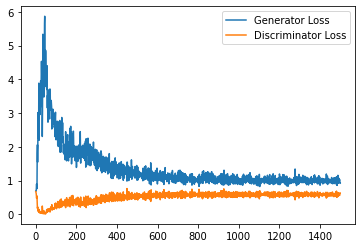

Step 30500: Generator loss: 0.9926407573223114, discriminator loss: 0.5885331574082374


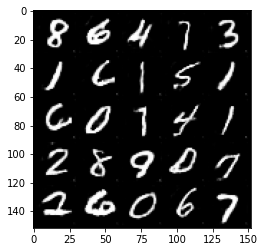

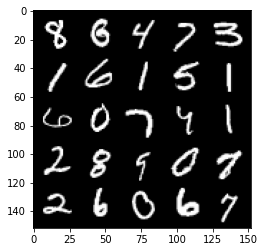

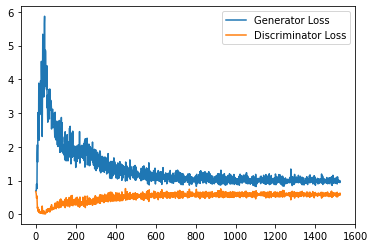

Step 31000: Generator loss: 1.0236754834651947, discriminator loss: 0.5853087530136108


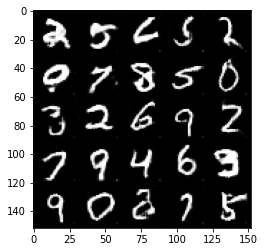

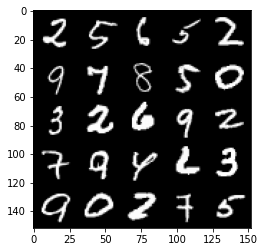

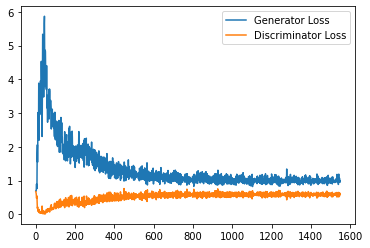

Step 31500: Generator loss: 0.9997734354734421, discriminator loss: 0.5818611412644387


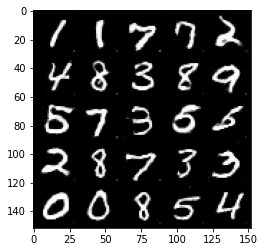

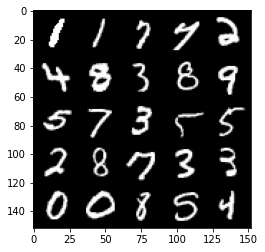

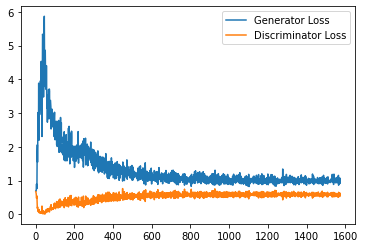

Step 32000: Generator loss: 1.0103548200130463, discriminator loss: 0.578172569334507


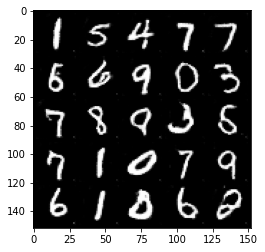

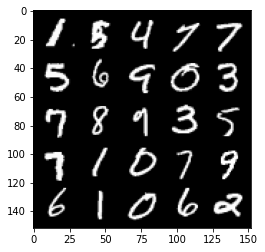

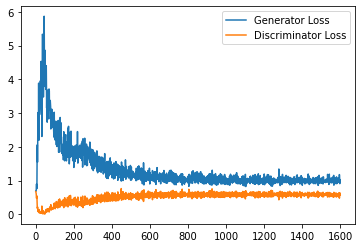

Step 32500: Generator loss: 1.0110119022130966, discriminator loss: 0.5834425755143166


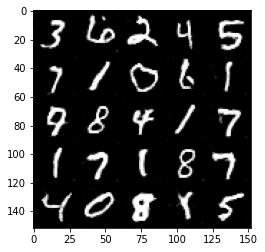

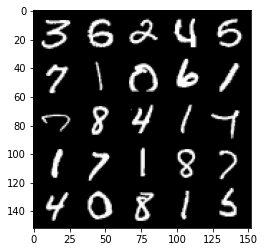

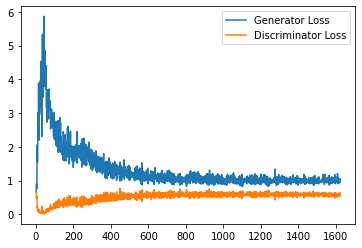

Step 33000: Generator loss: 1.0350740014314652, discriminator loss: 0.581324193418026


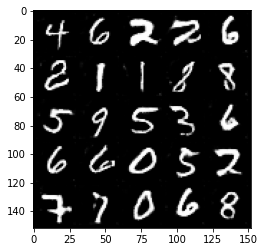

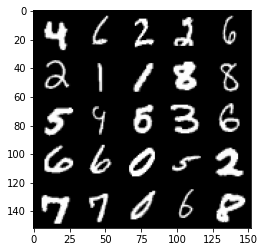

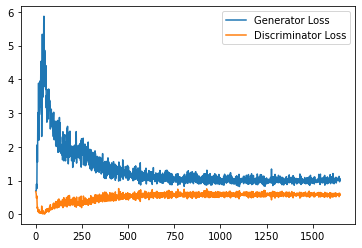

Step 33500: Generator loss: 1.0231626921892165, discriminator loss: 0.5879510071277618


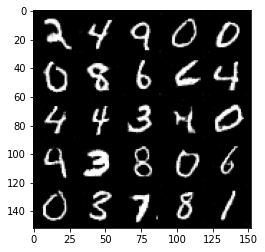

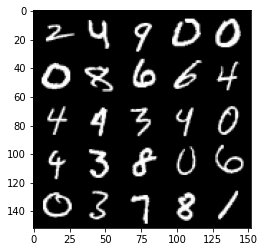

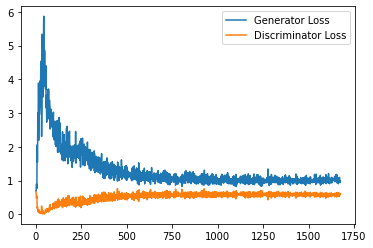

Step 34000: Generator loss: 1.0298505409955978, discriminator loss: 0.5780322098135948


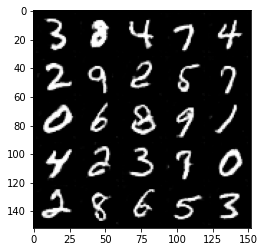

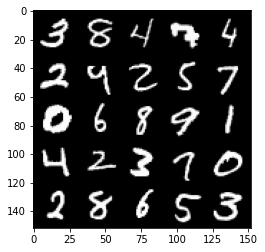

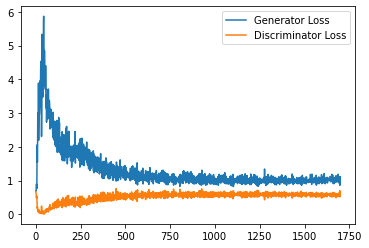

Step 34500: Generator loss: 1.0210728390216828, discriminator loss: 0.5808037262558937


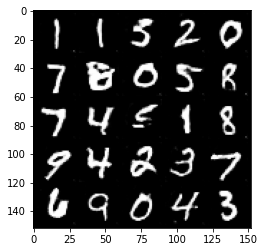

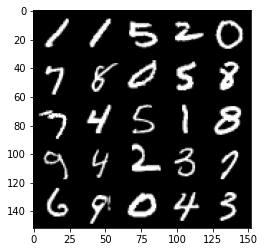

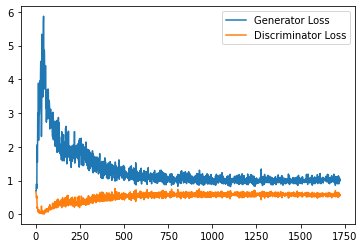

Step 35000: Generator loss: 1.0343782024383545, discriminator loss: 0.5811857432126999


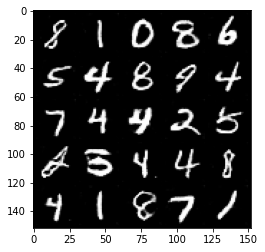

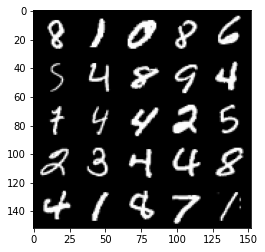

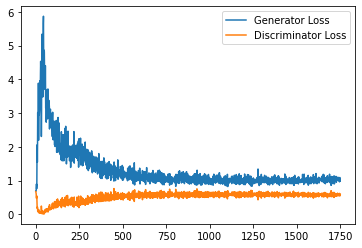

Step 35500: Generator loss: 1.0247624343633652, discriminator loss: 0.5801804724931717


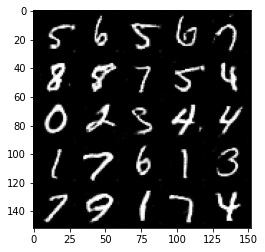

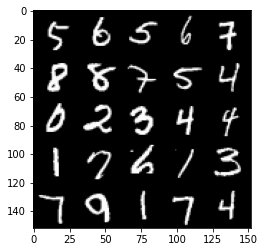

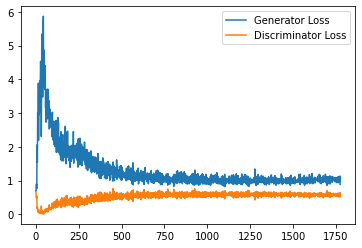

Step 36000: Generator loss: 1.028782331109047, discriminator loss: 0.5805009940266609


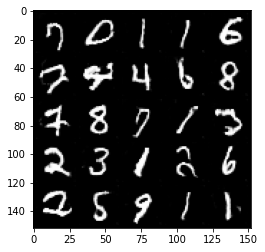

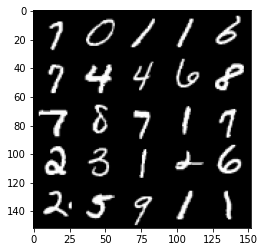

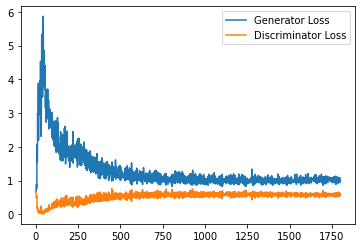

Step 36500: Generator loss: 1.0352702939510345, discriminator loss: 0.5763151852488517


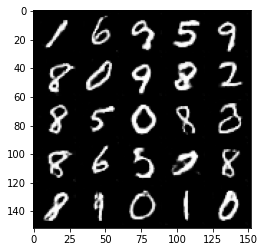

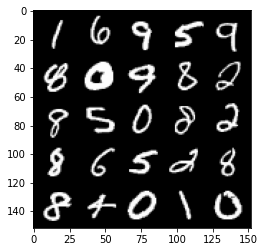

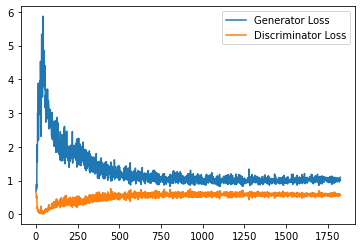

Step 37000: Generator loss: 1.0182862832546233, discriminator loss: 0.5767269802689552


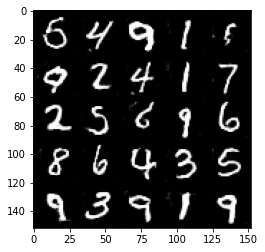

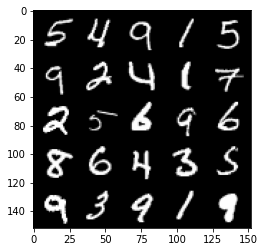

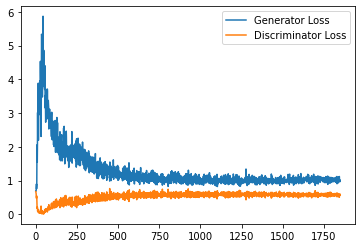

Step 37500: Generator loss: 1.0218851808309555, discriminator loss: 0.5748880072236061


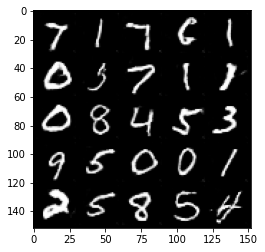

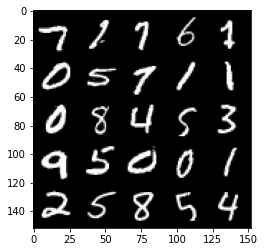

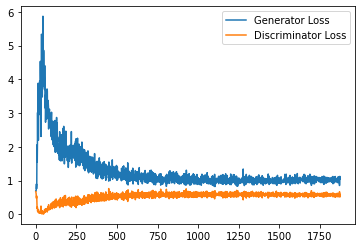

Step 38000: Generator loss: 1.0256820265054702, discriminator loss: 0.5771567568182945


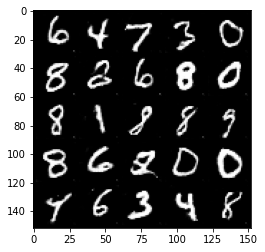

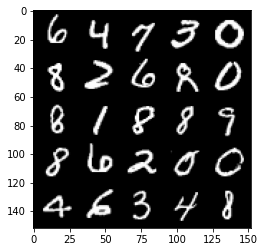

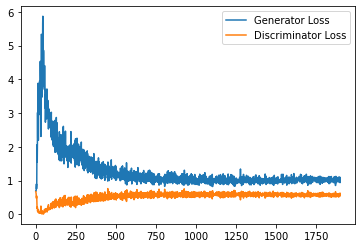

Step 38500: Generator loss: 1.045739708662033, discriminator loss: 0.5752437273859978


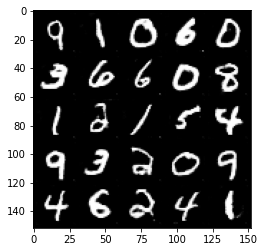

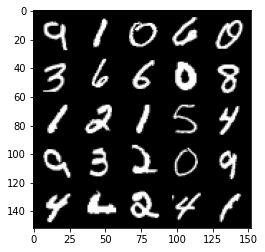

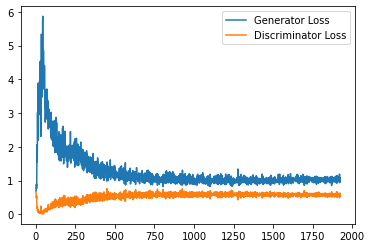

Step 39000: Generator loss: 1.0465675913095474, discriminator loss: 0.5692106793522835


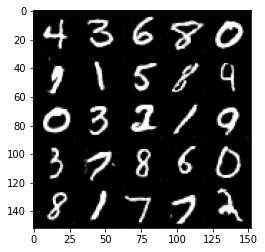

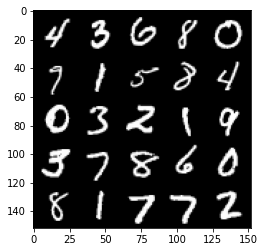

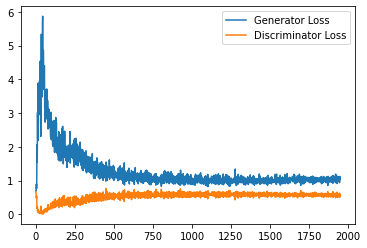

Step 39500: Generator loss: 1.04220381295681, discriminator loss: 0.575136628806591


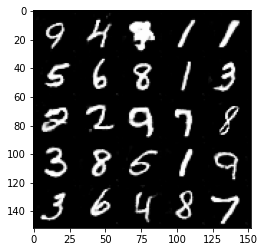

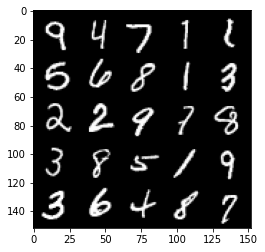

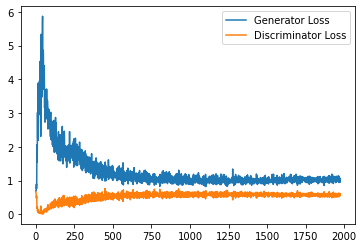

Step 40000: Generator loss: 1.0531905156373977, discriminator loss: 0.5750979199409485


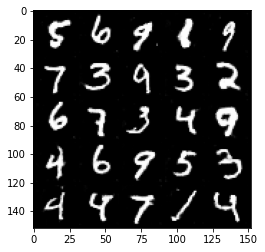

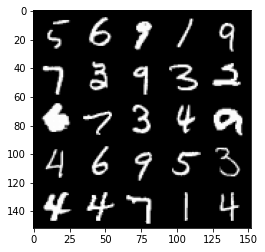

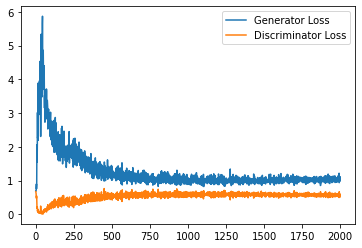

Step 40500: Generator loss: 1.0487991578578948, discriminator loss: 0.5734563051462174


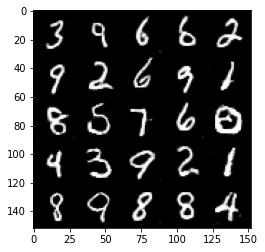

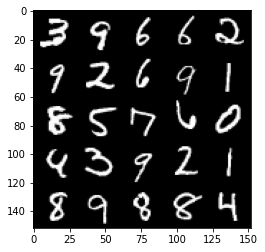

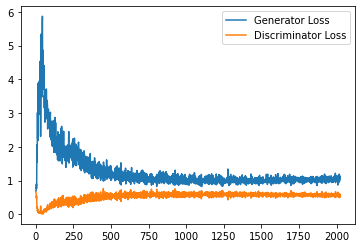

Step 41000: Generator loss: 1.0439269243478775, discriminator loss: 0.5811920908689499


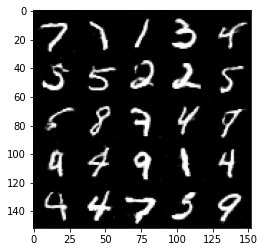

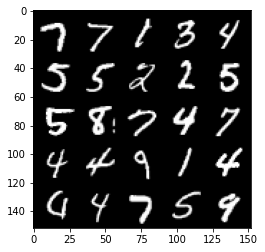

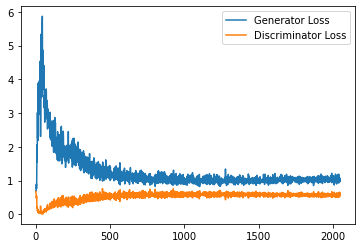

Step 41500: Generator loss: 1.04753766143322, discriminator loss: 0.5713362961411476


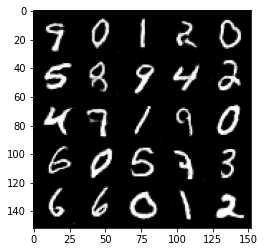

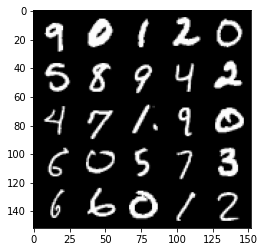

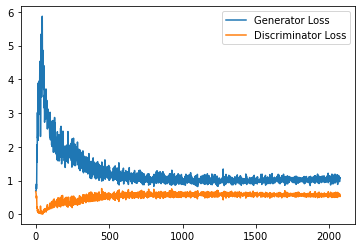

Step 42000: Generator loss: 1.0486869159936905, discriminator loss: 0.5768648042082787


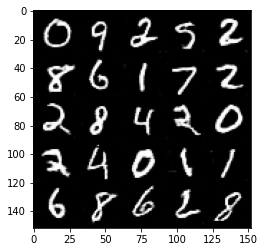

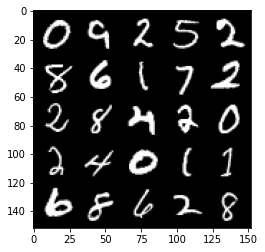

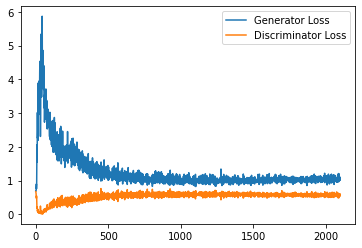

Step 42500: Generator loss: 1.0523112313747407, discriminator loss: 0.5732972548007965


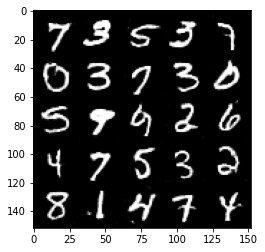

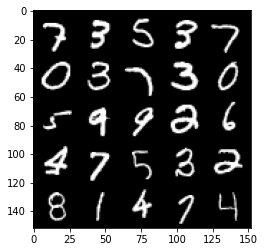

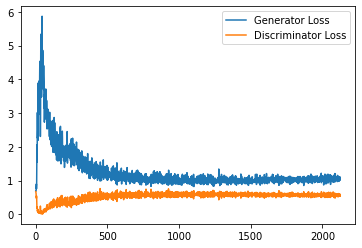

Step 43000: Generator loss: 1.0583207019567489, discriminator loss: 0.5683795908689498


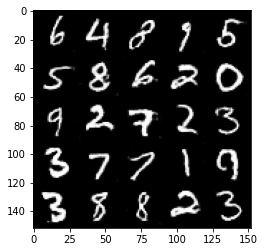

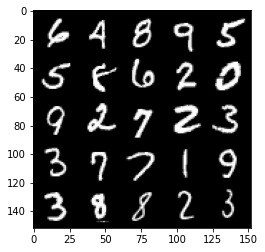

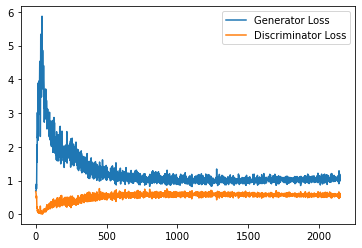

Step 43500: Generator loss: 1.0480481340885162, discriminator loss: 0.5728372762203217


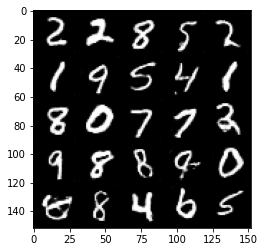

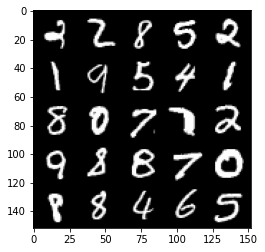

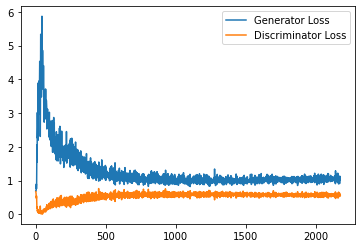

Step 44000: Generator loss: 1.0555810451507568, discriminator loss: 0.5746248404979706


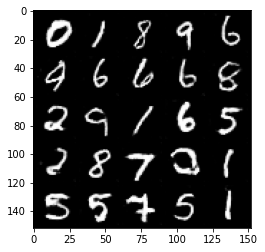

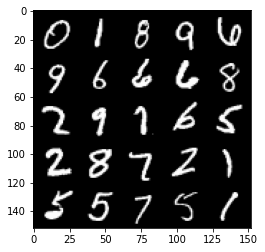

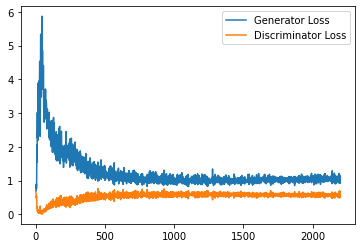

Step 44500: Generator loss: 1.0703695118427277, discriminator loss: 0.5711567017436028


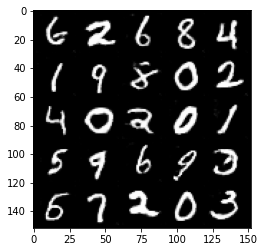

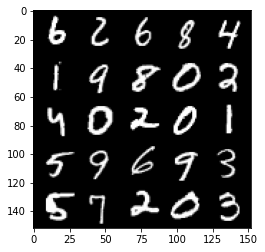

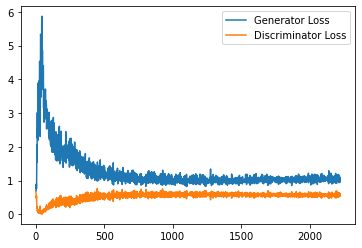

Step 45000: Generator loss: 1.0561421514749527, discriminator loss: 0.5767520620822907


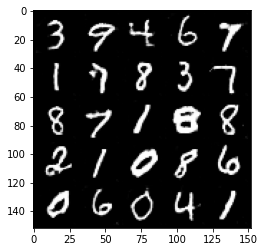

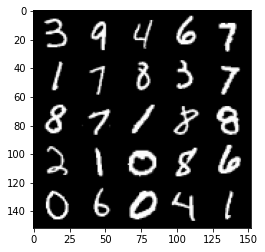

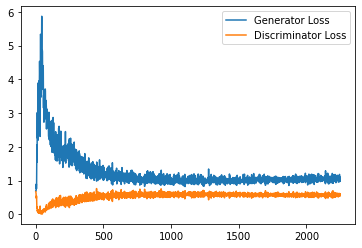

Step 45500: Generator loss: 1.0490612822771073, discriminator loss: 0.5684247360825538


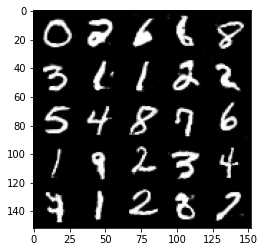

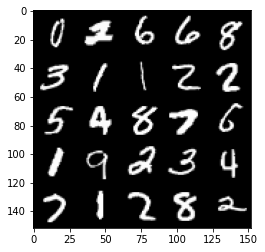

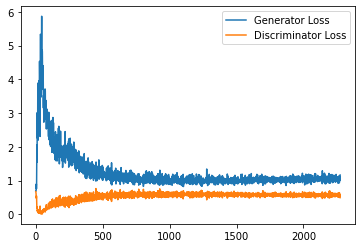

Step 46000: Generator loss: 1.0650189920663833, discriminator loss: 0.5716291217207908


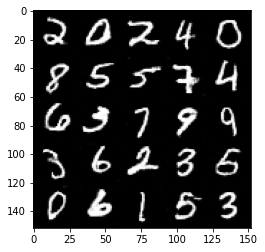

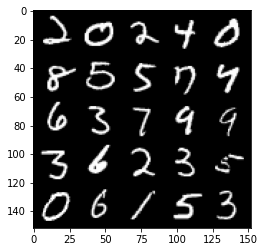

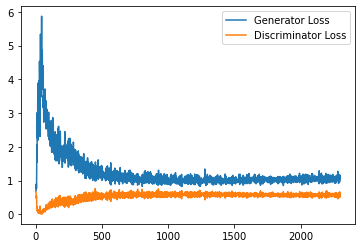

Step 46500: Generator loss: 1.057415279507637, discriminator loss: 0.5725062201023102


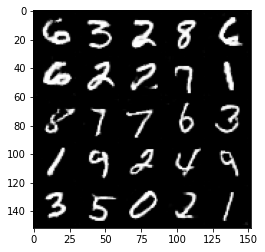

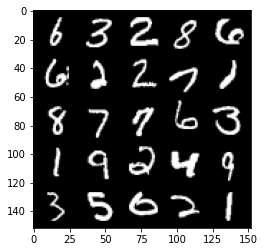

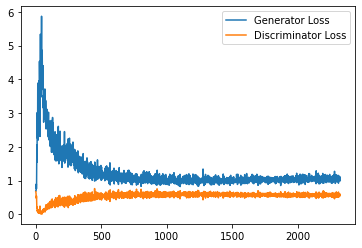

Step 47000: Generator loss: 1.049808672785759, discriminator loss: 0.5702730242609978


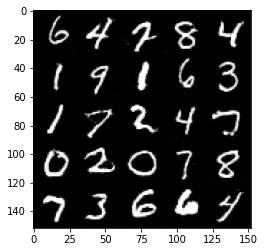

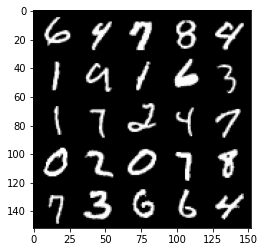

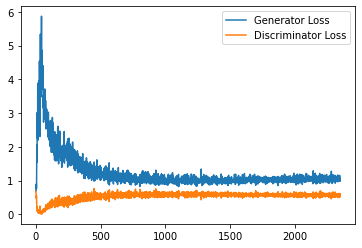

Step 47500: Generator loss: 1.046289612531662, discriminator loss: 0.5719833399653435


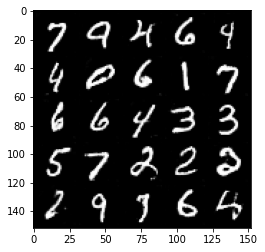

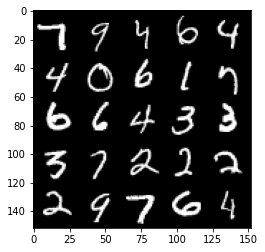

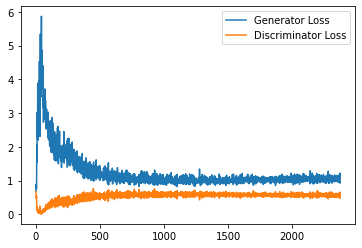

Step 48000: Generator loss: 1.0750661183595658, discriminator loss: 0.5668706025481224


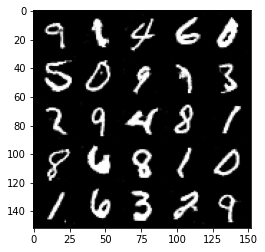

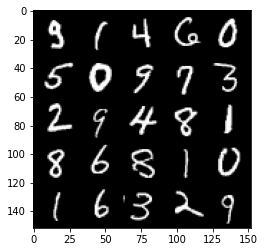

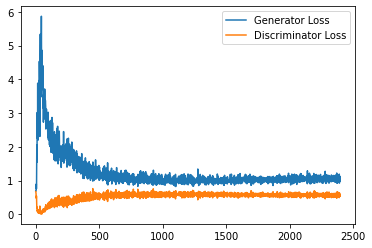

Step 48500: Generator loss: 1.080377183675766, discriminator loss: 0.5679338052272797


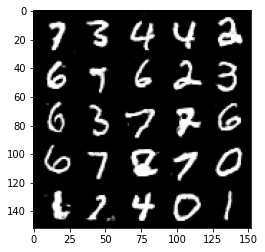

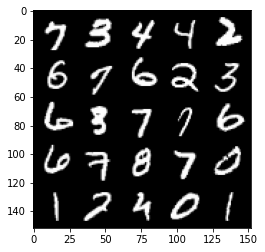

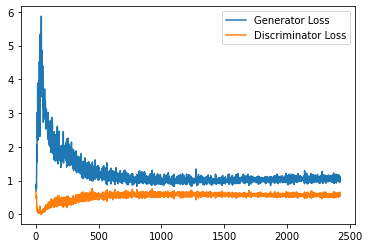

Step 49000: Generator loss: 1.0507978564500808, discriminator loss: 0.5695049811005592


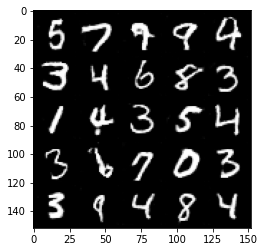

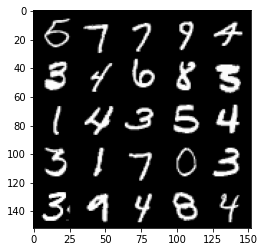

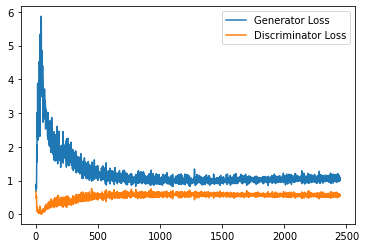

Step 49500: Generator loss: 1.072917581796646, discriminator loss: 0.5670620017647743


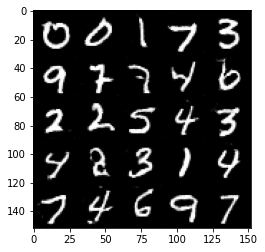

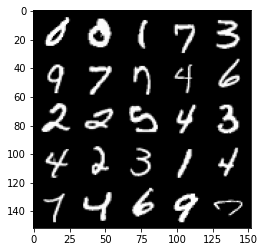

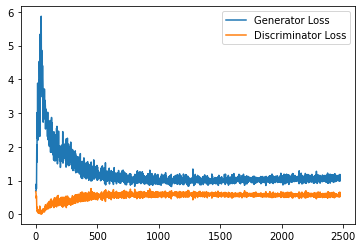

Step 50000: Generator loss: 1.080919531583786, discriminator loss: 0.5720292817354202


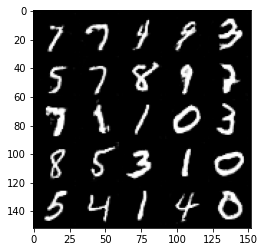

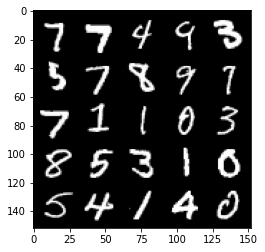

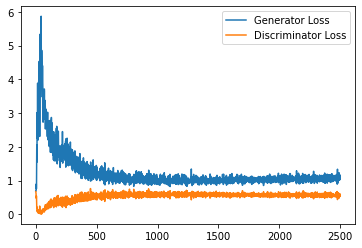

Step 50500: Generator loss: 1.0710148071050645, discriminator loss: 0.5686219009160995


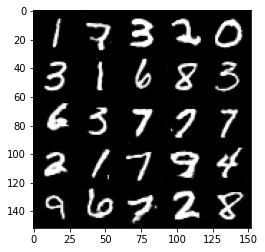

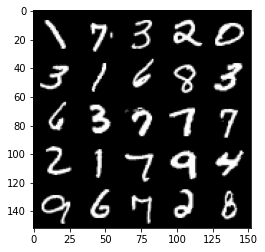

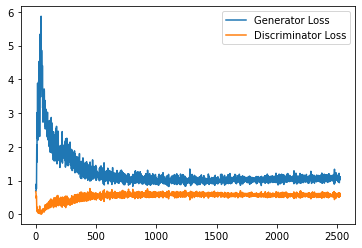

Step 51000: Generator loss: 1.0671675975322723, discriminator loss: 0.5668950046300888


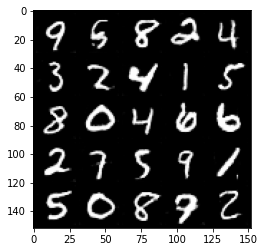

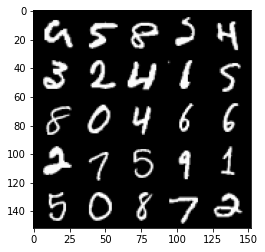

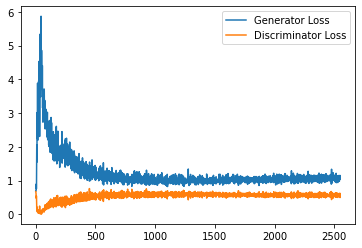

Step 51500: Generator loss: 1.088499133348465, discriminator loss: 0.5681041700839996


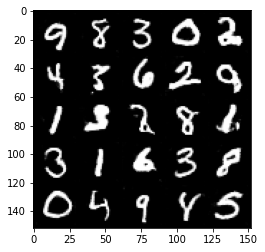

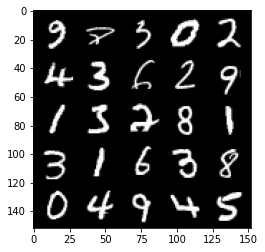

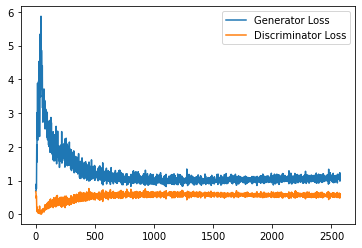

Step 52000: Generator loss: 1.0740772130489349, discriminator loss: 0.5692370218634606


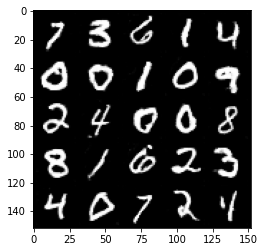

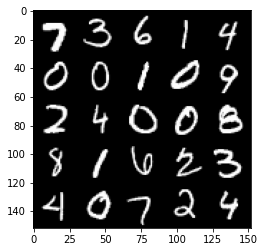

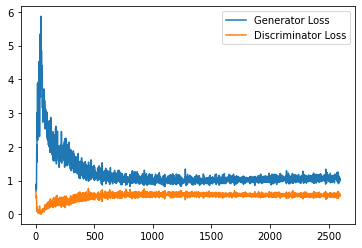

Step 52500: Generator loss: 1.0750839027166366, discriminator loss: 0.5690816727876663


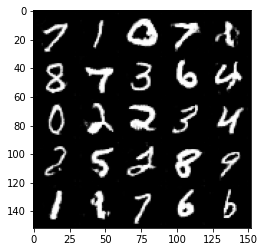

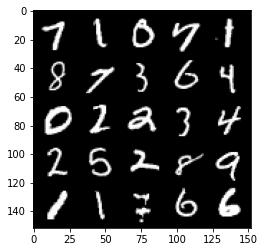

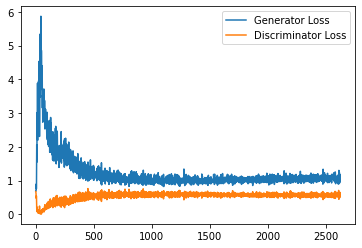

Step 53000: Generator loss: 1.076607500076294, discriminator loss: 0.5744417656064034


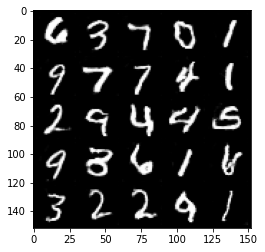

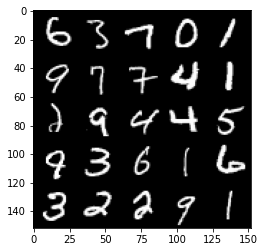

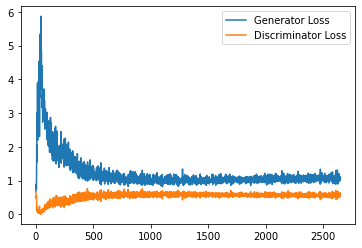

Step 53500: Generator loss: 1.0510688178539276, discriminator loss: 0.5696191818118096


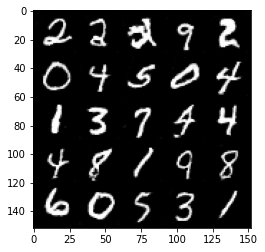

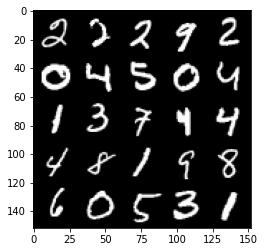

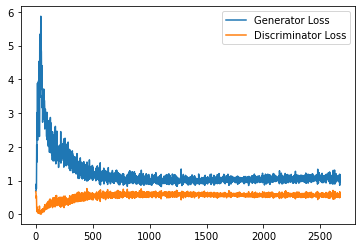

Step 54000: Generator loss: 1.0772481631040574, discriminator loss: 0.5585183873176575


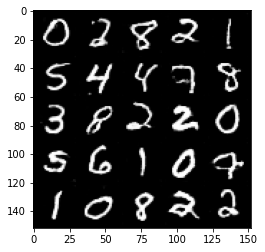

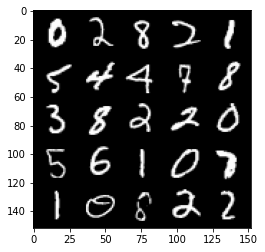

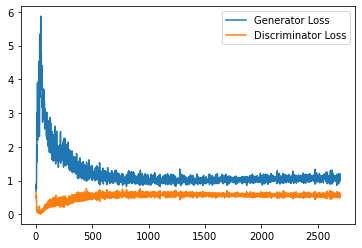

Step 54500: Generator loss: 1.09001071536541, discriminator loss: 0.564869286596775


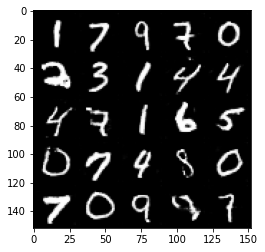

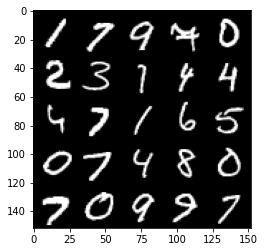

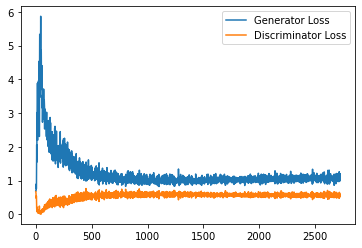

Step 55000: Generator loss: 1.095596526503563, discriminator loss: 0.5714407880306244


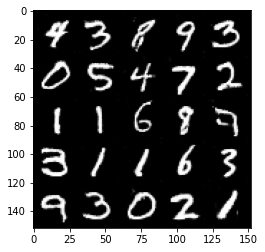

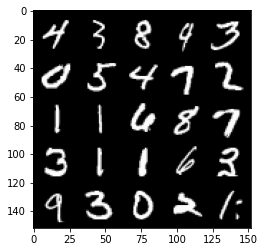

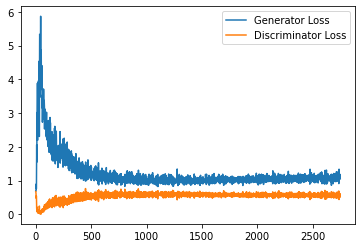

Step 55500: Generator loss: 1.0845837965011598, discriminator loss: 0.5648210521936416


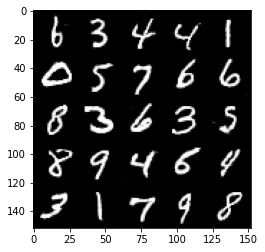

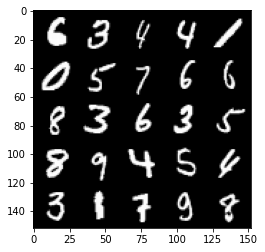

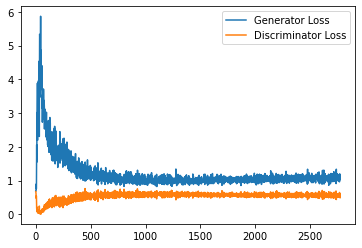

Step 56000: Generator loss: 1.0749155933856964, discriminator loss: 0.5696109085083008


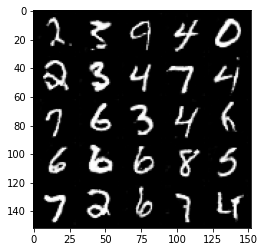

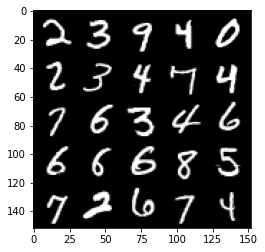

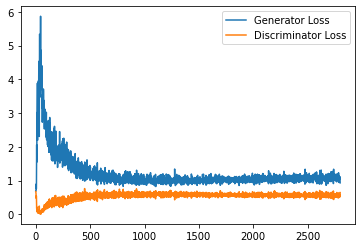

Step 56500: Generator loss: 1.0855177742242814, discriminator loss: 0.5667875272631645


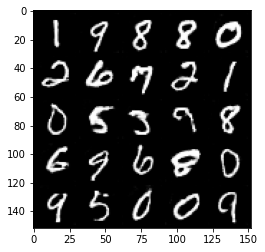

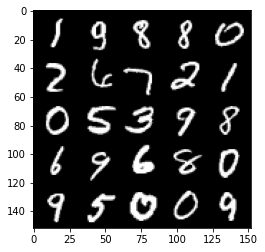

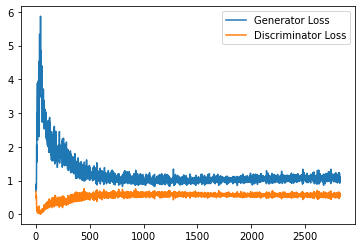

Step 57000: Generator loss: 1.0763827517032623, discriminator loss: 0.5606732614040375


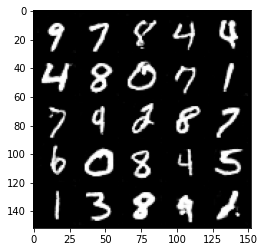

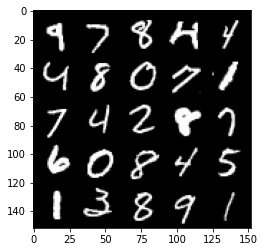

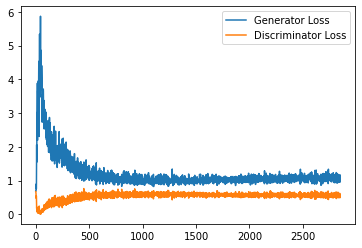

Step 57500: Generator loss: 1.0877860716581345, discriminator loss: 0.5649081792235374


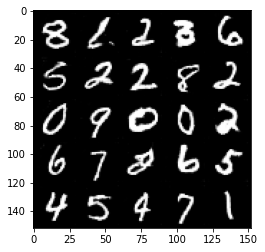

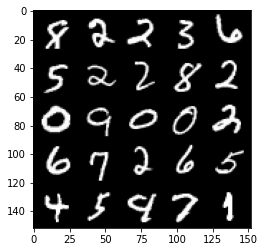

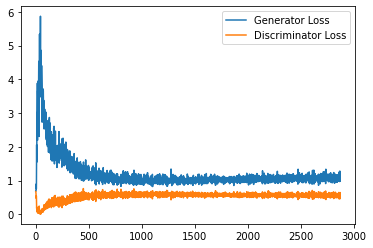

Step 58000: Generator loss: 1.083251799941063, discriminator loss: 0.5710494580864907


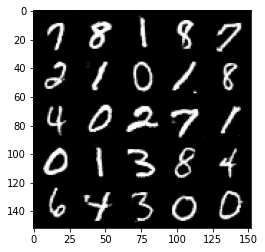

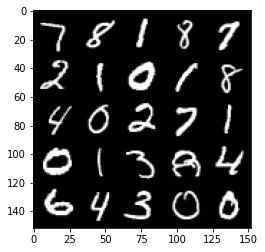

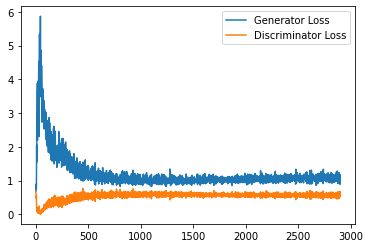

Step 58500: Generator loss: 1.0711082093715667, discriminator loss: 0.5597900267839432


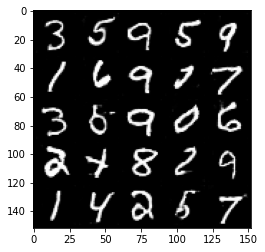

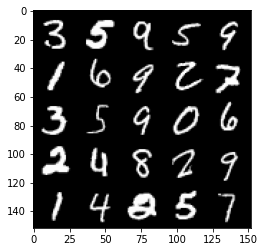

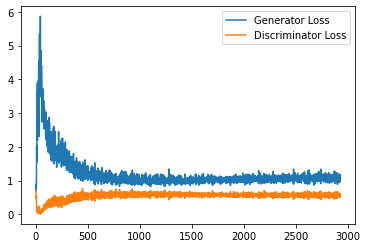

Step 59000: Generator loss: 1.107081235408783, discriminator loss: 0.5633915651440621


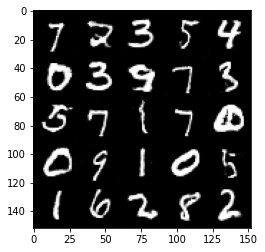

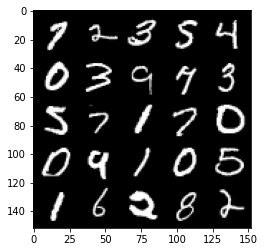

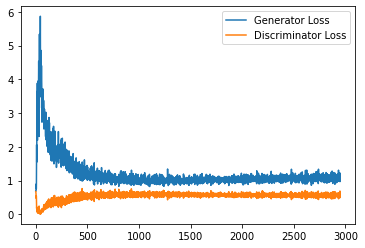

Step 59500: Generator loss: 1.0790301558971405, discriminator loss: 0.5648889684677124


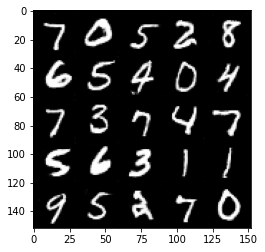

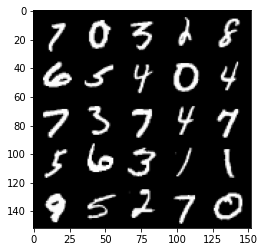

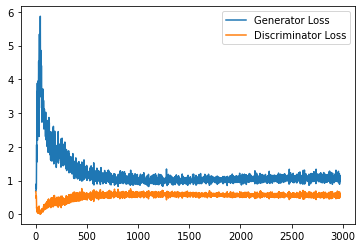

Step 60000: Generator loss: 1.0757304418087006, discriminator loss: 0.5590302183032035


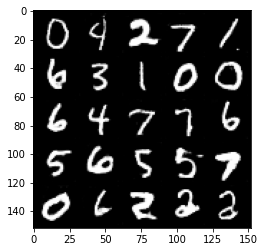

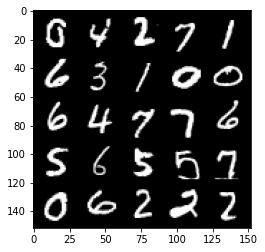

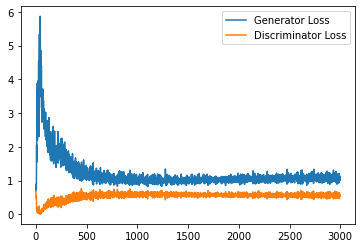

Step 60500: Generator loss: 1.1044850662946701, discriminator loss: 0.563569348871708


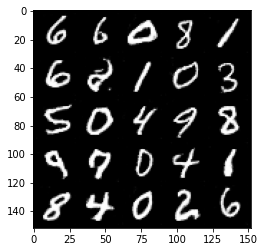

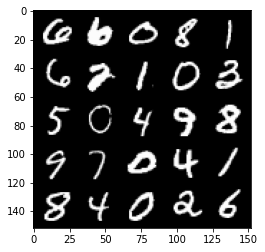

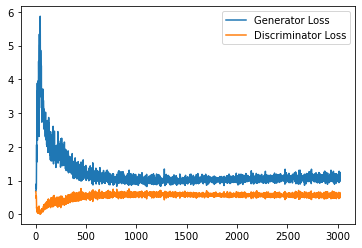

Step 61000: Generator loss: 1.096063714146614, discriminator loss: 0.5623124549984932


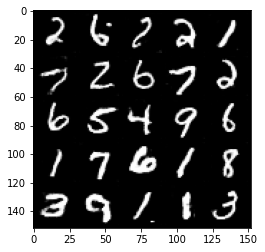

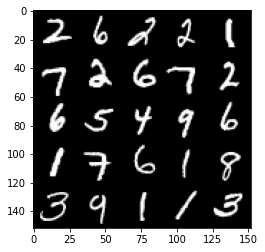

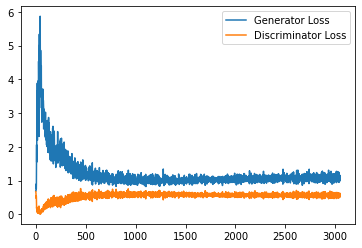

Step 61500: Generator loss: 1.1073882932662964, discriminator loss: 0.5614238337278367


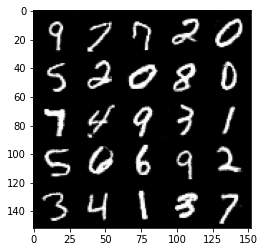

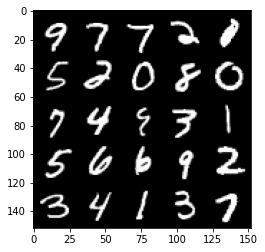

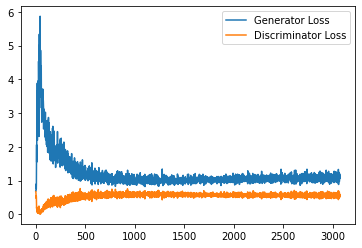

Step 62000: Generator loss: 1.1045528032779695, discriminator loss: 0.565112871825695


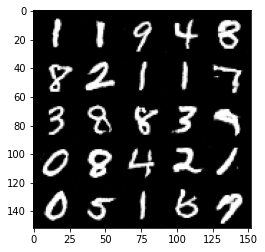

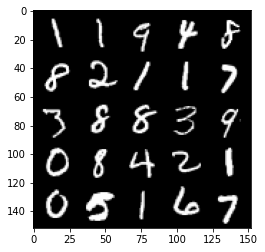

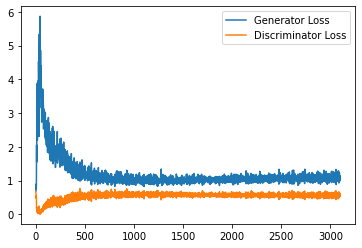

Step 62500: Generator loss: 1.0765744115114213, discriminator loss: 0.5638059595227242


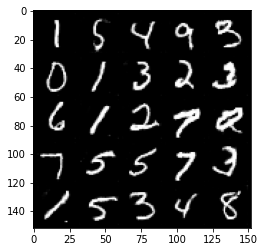

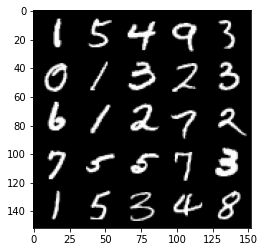

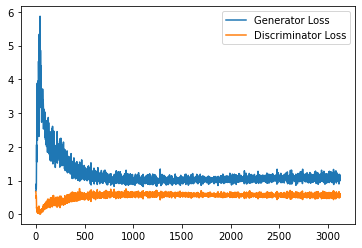

Step 63000: Generator loss: 1.1081463295221328, discriminator loss: 0.5599728523492813


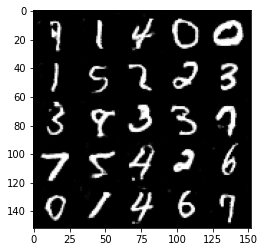

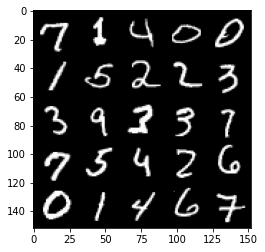

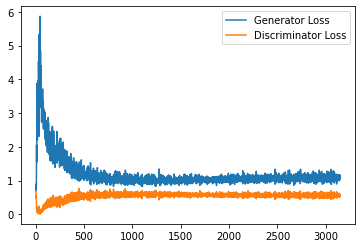

Step 63500: Generator loss: 1.0989507166147232, discriminator loss: 0.5599482888579369


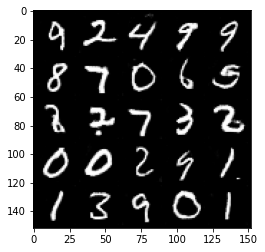

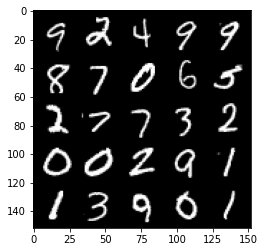

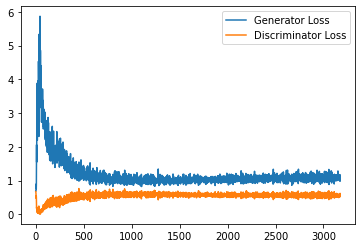

Step 64000: Generator loss: 1.1047361775636673, discriminator loss: 0.5633787357211113


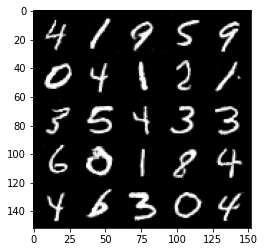

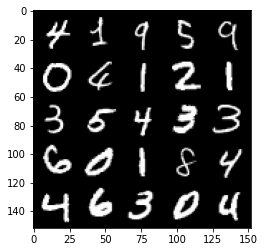

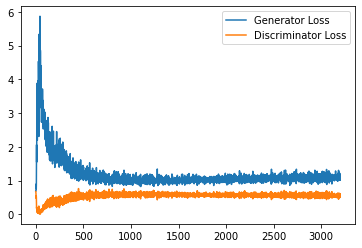

Step 64500: Generator loss: 1.0873336369991302, discriminator loss: 0.5589921650290489


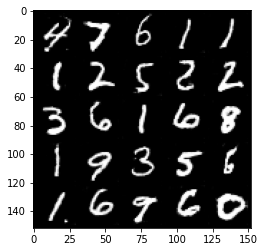

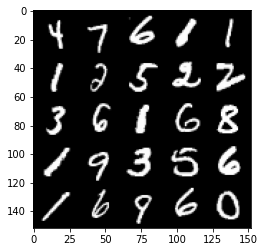

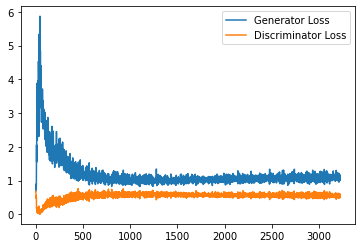

Step 65000: Generator loss: 1.084378694295883, discriminator loss: 0.5688468420505524


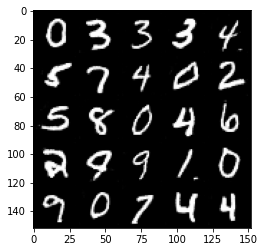

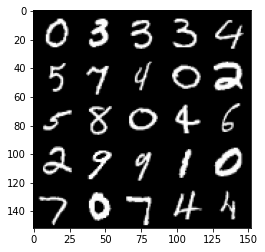

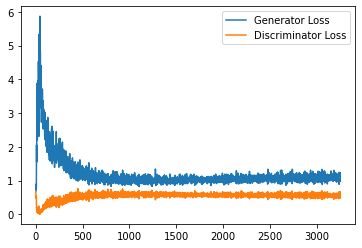

Step 65500: Generator loss: 1.1203965343236924, discriminator loss: 0.5594769540429115


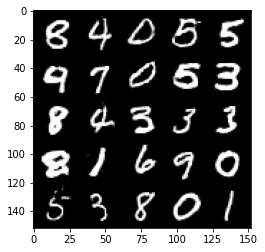

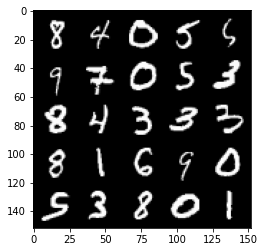

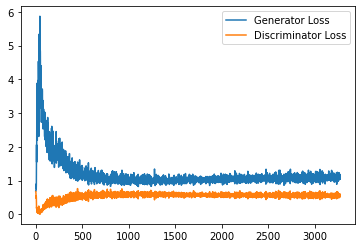

Step 66000: Generator loss: 1.1084046494960784, discriminator loss: 0.5601810349822044


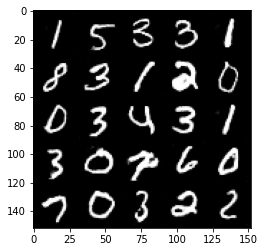

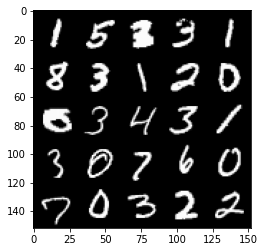

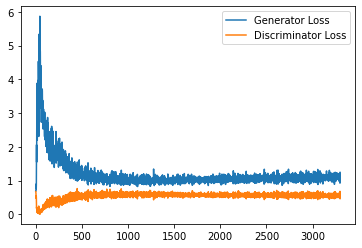

Step 66500: Generator loss: 1.0905752431154252, discriminator loss: 0.5695772792100906


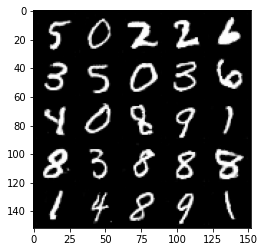

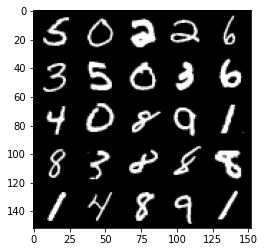

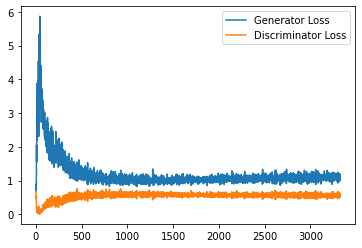

Step 67000: Generator loss: 1.0825775163173676, discriminator loss: 0.5656620880961418


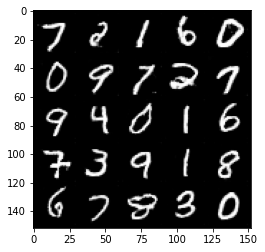

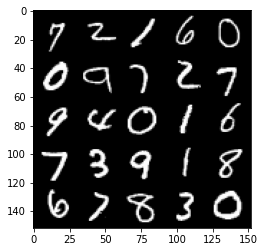

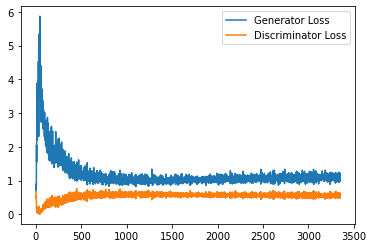

Step 67500: Generator loss: 1.095111381649971, discriminator loss: 0.5649355769753456


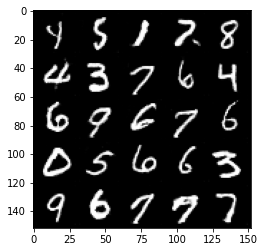

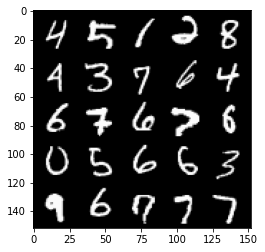

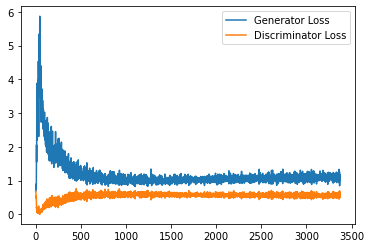

Step 68000: Generator loss: 1.0915661796331406, discriminator loss: 0.5679087897539139


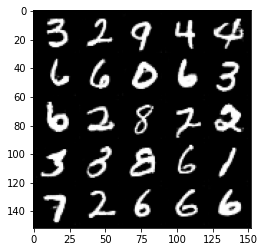

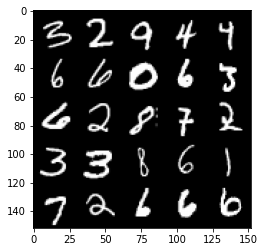

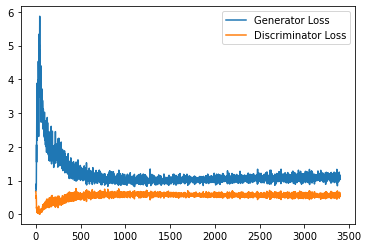

Step 68500: Generator loss: 1.1090747392177582, discriminator loss: 0.5658916975855828


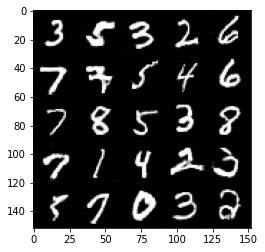

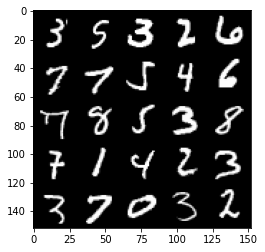

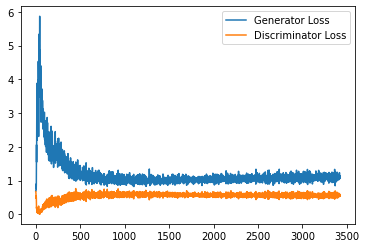

Step 69000: Generator loss: 1.1078551867008208, discriminator loss: 0.5638181236386299


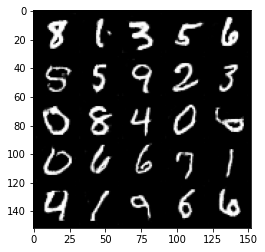

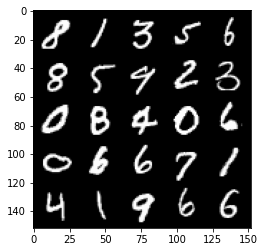

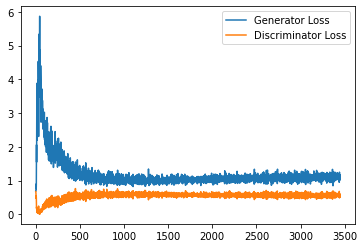

Step 69500: Generator loss: 1.089366708636284, discriminator loss: 0.5659764814972877


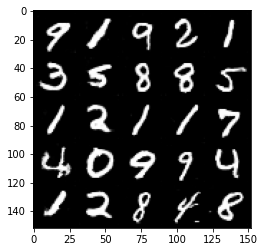

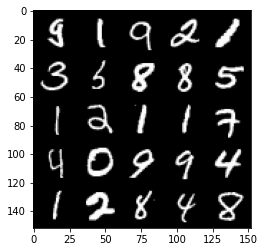

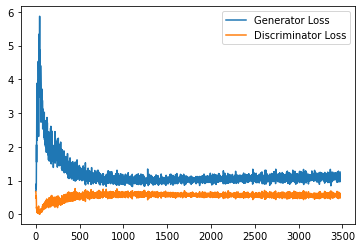

Step 70000: Generator loss: 1.0850823487043382, discriminator loss: 0.5676802811026573


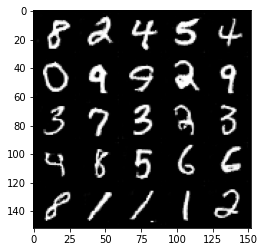

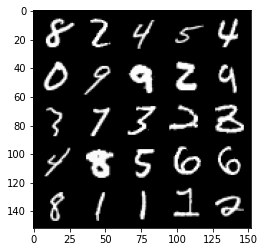

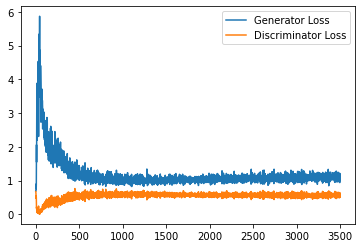

Step 70500: Generator loss: 1.103725940823555, discriminator loss: 0.5672333967089653


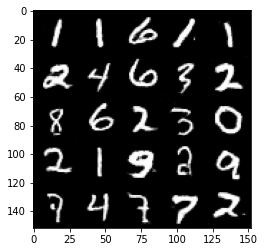

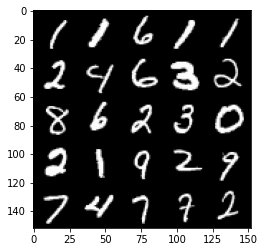

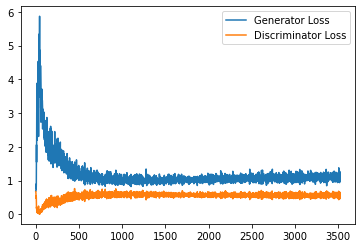

Step 71000: Generator loss: 1.1017255340814591, discriminator loss: 0.5678307774066925


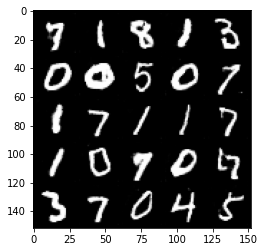

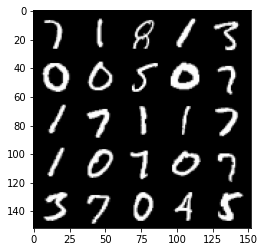

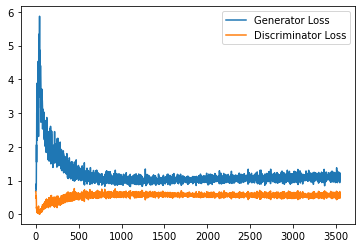

Step 71500: Generator loss: 1.0945373109579086, discriminator loss: 0.5650277111530304


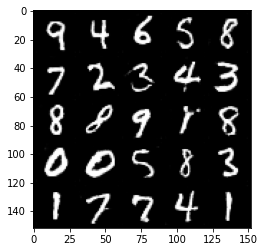

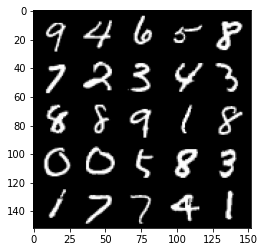

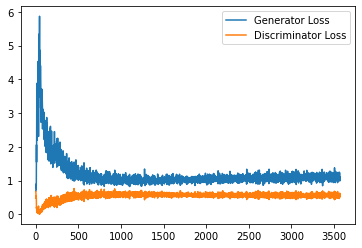

Step 72000: Generator loss: 1.0901221895217896, discriminator loss: 0.5646950660943985


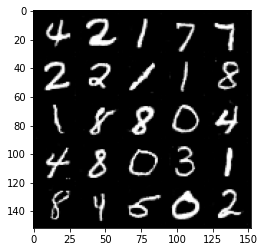

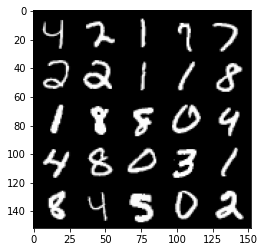

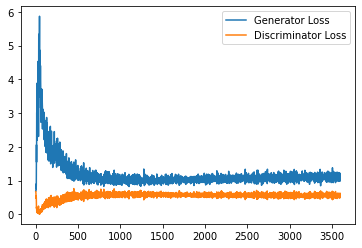

Step 72500: Generator loss: 1.1105319913625717, discriminator loss: 0.5622975378036499


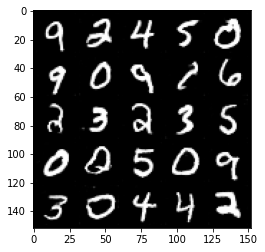

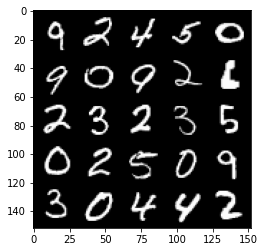

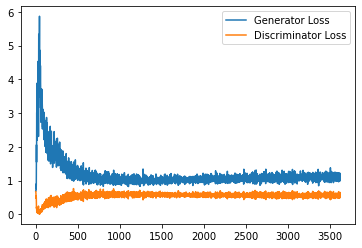

Step 73000: Generator loss: 1.1145871522426605, discriminator loss: 0.5689153608679771


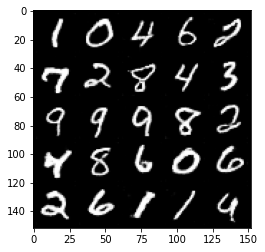

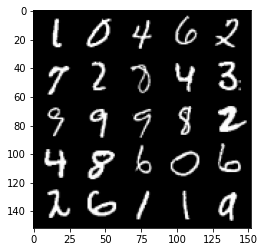

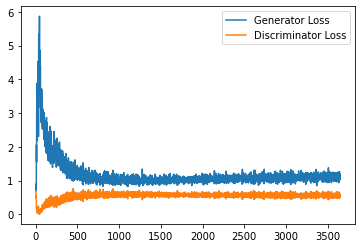

Step 73500: Generator loss: 1.0940560624599456, discriminator loss: 0.567585914850235


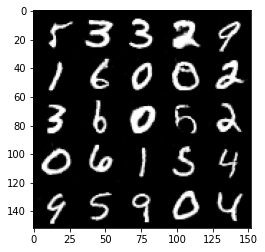

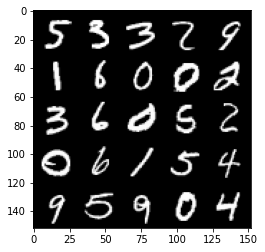

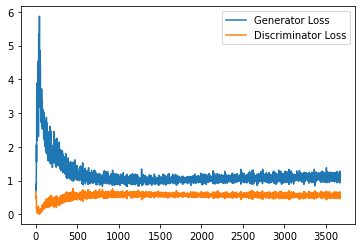

Step 74000: Generator loss: 1.0724591920375823, discriminator loss: 0.5697657009363174


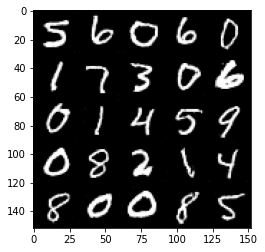

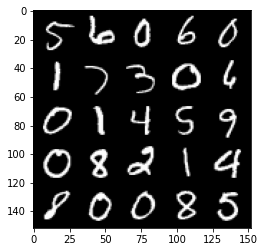

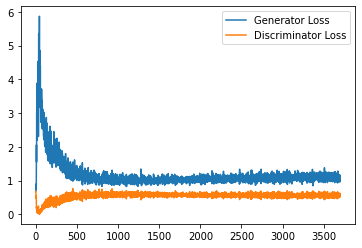

Step 74500: Generator loss: 1.0940755956172943, discriminator loss: 0.5649461592435837


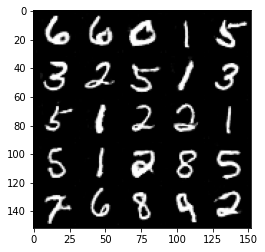

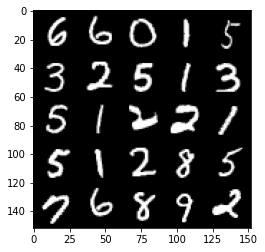

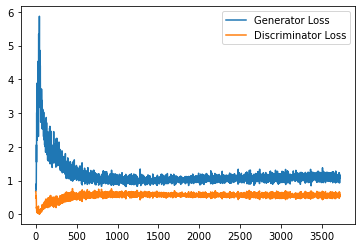

Step 75000: Generator loss: 1.1019365651607513, discriminator loss: 0.5720140888094902


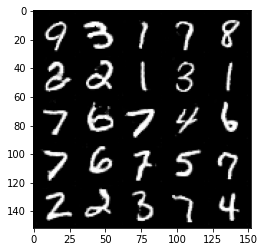

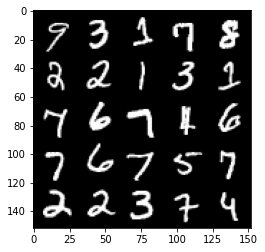

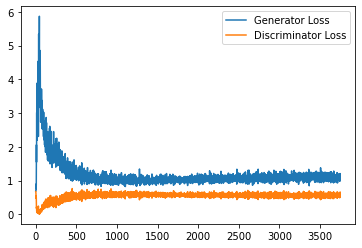

In [ ]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED CELL
cur_step = 0
generator_losses = []
discriminator_losses = []

#UNIT TEST NOTE: Initializations needed for grading
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        
        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images
       
        #### START CODE HERE ####
        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)
        #### END CODE HERE ####
        
        # Make sure that enough images were generated
        assert len(fake) == len(real)
        # Check that correct tensors were combined
        assert tuple(noise_and_labels.shape) == (cur_batch_size, fake_noise.shape[1] + one_hot_labels.shape[1])
        # It comes from the correct generator
        assert tuple(fake.shape) == (len(real), 1, 28, 28)

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels, 
        #              remember to detach the generator (.detach()) so you do not backpropagate through it
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred
        
        #### START CODE HERE ####
        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels.detach())
        disc_real_pred = disc(real_image_and_labels)
        #### END CODE HERE ####
        
        # Make sure shapes are correct 
        assert tuple(fake_image_and_labels.shape) == (len(real), fake.detach().shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        assert tuple(real_image_and_labels.shape) == (len(real), real.shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)
        # Shapes must match
        assert tuple(fake_image_and_labels.shape) == tuple(real_image_and_labels.shape)
        assert tuple(disc_fake_pred.shape) == tuple(disc_real_pred.shape)
        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1
        

## Exploration
You can do a bit of exploration now!

In [ ]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Class Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

In [ ]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

### Change me! ###
start_plot_number = 1 # Choose the start digit
### Change me! ###
end_plot_number = 5 # Choose the end digit

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

### Uncomment the following lines of code if you would like to visualize a set of pairwise class 
### interpolations for a collection of different numbers, all in a single grid of interpolations.
### You'll also see another visualization like this in the next code block!
# plot_numbers = [2, 3, 4, 5, 7]
# n_numbers = len(plot_numbers)
# plt.figure(figsize=(8, 8))
# for i, first_plot_number in enumerate(plot_numbers):
#     for j, second_plot_number in enumerate(plot_numbers):
#         plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
#         interpolate_class(first_plot_number, second_plot_number)
#         plt.axis('off')
# plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
# plt.show()
# plt.close()

#### Changing the Noise Vector
Now, what happens if you hold the class constant, but instead you change the noise vector? You can also interpolate the noise vector and generate an image at each step.

In [ ]:
n_interpolation = 9 # How many intermediate images you want + 2 (for the start and end image)

# This time you're interpolating between the noise instead of the labels
interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    # This time you're interpolating between the noise instead of the labels
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    # Combine the noise and the labels again
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

# Generate noise vectors to interpolate between
### Change me! ###
n_noise = 5 # Choose the number of noise examples in the grid
plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()